In [1]:
%matplotlib inline


import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime


bif_c = 0.2
num_iter_max=200000
seed = 0

# alpha=0.1
# alpha=0.2
alpha=0.3
# alpha=0.5


# alpha=0.8 # predict diverge
# vae_lr=1e-5
vae_lr=5e-4
ratio_lr=5e-4
ratio_early=100
env_name = 'CustomPendulum-v0'
env_str="pendulum"
figfilenamehead = "fig_policy_evaluation_pendulum_"

loss_list = []
normalized_loss_list = []

In [2]:
import gym
import custom_gym
env = gym.make(env_name)

env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = 1
print(s_dim, a_dim, z_dim)



c = 0.21455680991172585
2 1 1


/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site

In [3]:


from sac import SAC
agent = SAC(env.observation_space.shape[0], env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_mdp_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_mdp_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":agent.policy.my_np_select_action,
    "bamdp_policy":None,
    "debug_info":debug_info,
    "env" : env
    }
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base()
iwvi.update_mulogvar_offlinedata()

load vi_base_ckpt


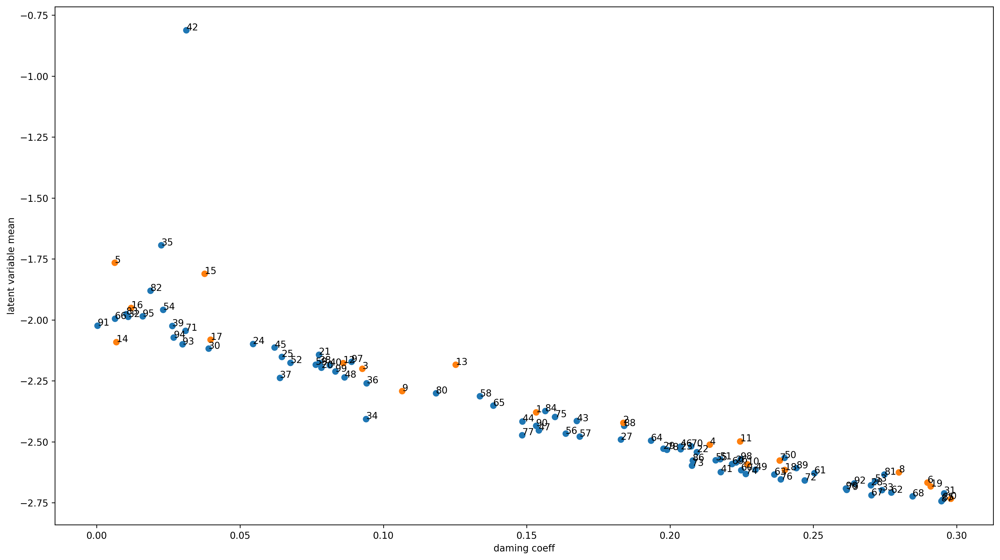

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_iter0.eps")
plt.savefig(figfilenamehead+"damping_latent_iter0.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.xlim([0.06,0.14])
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_mdppolicy_data()

0  c = 0.16346495489906906
1  c = 0.175923049855898
2  c = 0.213101048692264
3  c = 0.14501806056071762
4  c = 0.004052611988015664


/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observation space.
  logger.warn(f

5  c = 0.120134560420777
6  c = 0.25697024030079035
7  c = 0.09642657758269942
8  c = 0.05526129195564814
9  c = 0.11417486037608537
10  c = 0.25864988011260814
11  c = 0.020876132555705383
12  c = 0.2613891486606151
13  c = 0.10624180953664825
14  c = 0.03203027777652895
15  c = 0.1622476552961531
16  c = 0.1618277342655034
17  c = 0.055320312028603325
18  c = 0.09391364165595244
19  c = 0.11885913261799258
20  c = 0.11403897859981632
21  c = 0.09912067121474619
22  c = 0.06488189030041151
23  c = 0.03506631058301788
24  c = 0.19965083813641546
25  c = 0.08571604451747712
26  c = 0.1514796791677473
27  c = 0.04546713757372708
28  c = 0.13733918450179566
29  c = 0.1522597624567635
30  c = 0.02389789952996266
31  c = 0.0638122346167221
32  c = 0.28146488121321594
33  c = 0.2259386184773079
34  c = 0.28977259206899
35  c = 0.15402135084365112
36  c = 0.14479756250669107
37  c = 0.013467426965231165
38  c = 0.28867430773725383
39  c = 0.13289400919772665
40  c = 0.25571722661756824
41  c 

In [7]:
# fig = plt.figure(figsize=(18,10))
# ax_list = []
# for i in range(50):
#     ax_list.append(fig.add_subplot(5, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1]) 
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1]) 
# print("オフラインデータvs実環境方策rollout")

0  c = 0.20021770810986864
1  c = 0.1983582812192558
2  c = 0.022555950291700478
3  c = 0.20541677419620874
4  c = 0.10100278390403257
5  c = 0.18626578567738697
6  c = 0.05051976271514567
7  c = 0.047219332290270255
8  c = 0.1703964189334006
9  c = 0.14840815680292022
10  c = 0.24494872822400177
11  c = 0.025342155733352467
12  c = 0.29120495159551035
13  c = 0.1062823595846313
14  c = 0.2005682341251094
15  c = 0.2575002131665844
16  c = 0.2478069086585581
17  c = 0.10556652164894924
18  c = 0.1263102409001565
19  c = 0.06421935796424785
20  c = 0.162199131307732
21  c = 0.2946662208960819
22  c = 0.07020726813281049
23  c = 0.15752760672287627
24  c = 0.08439030047625135
25  c = 0.07330712053657978
26  c = 0.1016651025954488
27  c = 0.006908891882512702
28  c = 0.1901597193331265
29  c = 0.1863173542495256
30  c = 0.15759887301895484
31  c = 0.0308689768266279
32  c = 0.24135050248338633
33  c = 0.2181328493603175
34  c = 0.10463073088503207
35  c = 0.04975650100345974
36  c = 0.179

98  c = 0.2568501254838801
99  c = 0.13509519895595778
 
実環境方策rollout vs Sim環境方策rollout


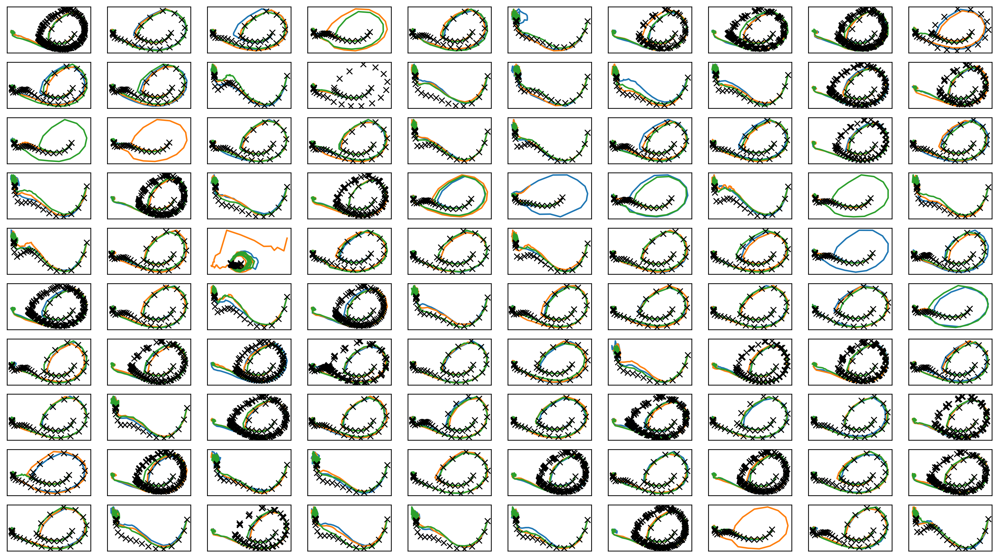

In [8]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter0.png")
plt.savefig(figfilenamehead+"joint_iter0.eps")
plt.savefig(figfilenamehead+"joint_iter0.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-04-12 13:25:44.949105


# Iter 1

In [10]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  c = 0.09727900638984362
c = 0.19707890144065085
c = 0.2891712920787421
c = 0.023521299300759125
c = 0.20523577968795767
c = 0.23590522177367665
c = 0.008477972314120097
c = 0.0029689683452523096
c = 0.009251997679063683
1  c = 0.07692327124558923
c = 0.09396389216709519
c = 0.07964107686805462
c = 0.06343488052393406
c = 0.24552847041865347
c = 0.09801626505407315
c = 0.024863717205578673
c = 0.24857176546211582
c = 0.017347355617158656
c = 0.039845718166765166
2  c = 0.17432736200453677
c = 0.054504068698648656
c = 0.1038273195199077
c = 0.1880490881300592
c = 0.20357742157999598
c = 0.10243203801547246
c = 0.21030464402145654
c = 0.29526741876491275
c = 0.06555089226877321
c = 0.032139462474833076
c = 0.014239526318916906
3  c = 0.1698385562913544
c = 0.06154806697686888
c = 0.06705307058899984
c = 0.15583859935522135
c = 0.17707470996570454
4  c = 0.21131587603106716
c = 0.041218300948617066
c = 0.24787449695990696
c = 0.22121951044047505
c = 0.012671146183090941
c = 0.0266785082

c = 0.19474931128722503
c = 0.28029962292362426
38  c = 0.2830431689909222
c = 0.22354732029687485
c = 0.11880571402458309
c = 0.06956228154629632
c = 0.14719304303100558
c = 0.10386358993134288
c = 0.1898192215507655
c = 0.22879068732326985
c = 0.08289936340705091
c = 0.11394195539800445
c = 0.2725677982369533
c = 0.1933455445188592
39  c = 0.22318727215437703
c = 0.1844952960946807
c = 0.24655090543309238
c = 0.1044964860397626
c = 0.1405854633550413
c = 0.06025769571120415
c = 0.24236267752266288
c = 0.2055689518941486
c = 0.020783439833727834
c = 0.246706718843034
c = 0.11684164604266711
c = 0.09861438854681148
40  c = 0.0010938067490257164
c = 0.13122889599115845
c = 0.2917185138651958
c = 0.16991292318500875
c = 0.12418224416967803
c = 0.10278665431215286
c = 0.2226285077762982
c = 0.11706622203698806
c = 0.22892858385957396
c = 0.16870487119724586
c = 0.2294975425219668
41  c = 0.1003760776046577
c = 0.25490696726787493
c = 0.00638005437790331
c = 0.2860574853460712
c = 0.089184

75  c = 0.2518869850810772
c = 0.0067099979865313355
c = 0.03663865137166565
c = 0.1471720822141774
c = 0.12929540079698054
c = 0.23082251192246242
c = 0.0876400526682163
76  c = 0.21375367840521042
c = 0.18405974814048967
c = 0.10988467442475998
c = 0.18790349518310207
c = 0.08961451462666815
c = 0.2771888968951758
c = 0.2987503474678797
c = 0.03529722839723291
c = 0.2584529873719788
c = 0.0010379018920250616
c = 0.2805684681792523
c = 0.05237333121805956
c = 0.026822237455981533
77  c = 0.2388796244338437
c = 0.10626539922124115
c = 0.20555535694285587
c = 0.00840914382866954
c = 0.006229749680078322
c = 0.026163358819039185
c = 0.17932985562733983
c = 0.03667670675739197
c = 0.24513444614505234
c = 0.2357656808225332
c = 0.23095305291539642
c = 0.21483039836416198
78  c = 0.19536556427650756
c = 0.15837306569588475
c = 0.06678960150906656
c = 0.1043101331176575
c = 0.18149978032536104
c = 0.12911266702871554
c = 0.2522572516555469
c = 0.23274246198153117
c = 0.224512725676042
79  c 

In [11]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss 1.34450  validloss 1.40550±0.00000  bestvalidloss 1.40550  last_update 0
train: iter 1  trainloss 1.10765  validloss 1.26505±0.00000  bestvalidloss 1.26505  last_update 0
train: iter 2  trainloss 0.81537  validloss 0.91512±0.00000  bestvalidloss 0.91512  last_update 0
train: iter 3  trainloss 0.71165  validloss 0.70441±0.00000  bestvalidloss 0.70441  last_update 0
train: iter 4  trainloss 0.68130  validloss 0.64837±0.00000  bestvalidloss 0.64837  last_update 0
train: iter 5  trainloss 0.66704  validloss 0.62650±0.00000  bestvalidloss 0.62650  last_update 0
train: iter 6  trainloss 0.65615  validloss 0.61240±0.00000  bestvalidloss 0.61240  last_update 0
train: iter 7  trainloss 0.64613  validloss 0.60268±0.00000  bestvalidloss 0.60268  last_update 0
train: iter 8  trainloss 0.63687  validloss 0.59476±0.00000  bestvalidloss 0.59476  last_update 0
train: iter 9  trainloss 0.62952  validloss 0.58495±0.00000  bestvalidloss 0.58495  last_update 0
train: iter 10  trai

train: iter 85  trainloss 0.23848  validloss 0.24021±0.00000  bestvalidloss 0.23945  last_update 1
train: iter 86  trainloss 0.23679  validloss 0.23831±0.00000  bestvalidloss 0.23831  last_update 0
train: iter 87  trainloss 0.23588  validloss 0.23670±0.00000  bestvalidloss 0.23670  last_update 0
train: iter 88  trainloss 0.23624  validloss 0.23755±0.00000  bestvalidloss 0.23670  last_update 1
train: iter 89  trainloss 0.23632  validloss 0.23755±0.00000  bestvalidloss 0.23670  last_update 2
train: iter 90  trainloss 0.23371  validloss 0.23769±0.00000  bestvalidloss 0.23670  last_update 3
train: iter 91  trainloss 0.23110  validloss 0.23324±0.00000  bestvalidloss 0.23324  last_update 0
train: iter 92  trainloss 0.23172  validloss 0.23365±0.00000  bestvalidloss 0.23324  last_update 1
train: iter 93  trainloss 0.23148  validloss 0.23099±0.00000  bestvalidloss 0.23099  last_update 0
train: iter 94  trainloss 0.22961  validloss 0.23239±0.00000  bestvalidloss 0.23099  last_update 1
train: ite

train: iter 169  trainloss 0.20156  validloss 0.19926±0.00000  bestvalidloss 0.19926  last_update 0
train: iter 170  trainloss 0.20005  validloss 0.21966±0.00000  bestvalidloss 0.19926  last_update 1
train: iter 171  trainloss 0.20042  validloss 0.20305±0.00000  bestvalidloss 0.19926  last_update 2
train: iter 172  trainloss 0.19913  validloss 0.19983±0.00000  bestvalidloss 0.19926  last_update 3
train: iter 173  trainloss 0.19875  validloss 0.19922±0.00000  bestvalidloss 0.19922  last_update 0
train: iter 174  trainloss 0.19889  validloss 0.20233±0.00000  bestvalidloss 0.19922  last_update 1
train: iter 175  trainloss 0.19978  validloss 0.20231±0.00000  bestvalidloss 0.19922  last_update 2
train: iter 176  trainloss 0.20097  validloss 0.19831±0.00000  bestvalidloss 0.19831  last_update 0
train: iter 177  trainloss 0.19864  validloss 0.20249±0.00000  bestvalidloss 0.19831  last_update 1
train: iter 178  trainloss 0.19749  validloss 0.19944±0.00000  bestvalidloss 0.19831  last_update 2


train: iter 253  trainloss 0.18353  validloss 0.18862±0.00000  bestvalidloss 0.18862  last_update 0
train: iter 254  trainloss 0.18468  validloss 0.18964±0.00000  bestvalidloss 0.18862  last_update 1
train: iter 255  trainloss 0.18418  validloss 0.18857±0.00000  bestvalidloss 0.18857  last_update 0
train: iter 256  trainloss 0.18586  validloss 0.19439±0.00000  bestvalidloss 0.18857  last_update 1
train: iter 257  trainloss 0.18522  validloss 0.19386±0.00000  bestvalidloss 0.18857  last_update 2
train: iter 258  trainloss 0.18400  validloss 0.19078±0.00000  bestvalidloss 0.18857  last_update 3
train: iter 259  trainloss 0.18302  validloss 0.18899±0.00000  bestvalidloss 0.18857  last_update 4
train: iter 260  trainloss 0.18350  validloss 0.19034±0.00000  bestvalidloss 0.18857  last_update 5
train: iter 261  trainloss 0.18398  validloss 0.18892±0.00000  bestvalidloss 0.18857  last_update 6
train: iter 262  trainloss 0.18224  validloss 0.18780±0.00000  bestvalidloss 0.18780  last_update 0


train: iter 337  trainloss 0.17405  validloss 0.18227±0.00000  bestvalidloss 0.18227  last_update 0
train: iter 338  trainloss 0.17840  validloss 0.18576±0.00000  bestvalidloss 0.18227  last_update 1
train: iter 339  trainloss 0.17470  validloss 0.18483±0.00000  bestvalidloss 0.18227  last_update 2
train: iter 340  trainloss 0.17545  validloss 0.18158±0.00000  bestvalidloss 0.18158  last_update 0
train: iter 341  trainloss 0.17408  validloss 0.18291±0.00000  bestvalidloss 0.18158  last_update 1
train: iter 342  trainloss 0.17493  validloss 0.18242±0.00000  bestvalidloss 0.18158  last_update 2
train: iter 343  trainloss 0.17426  validloss 0.18269±0.00000  bestvalidloss 0.18158  last_update 3
train: iter 344  trainloss 0.17534  validloss 0.18890±0.00000  bestvalidloss 0.18158  last_update 4
train: iter 345  trainloss 0.17453  validloss 0.18363±0.00000  bestvalidloss 0.18158  last_update 5
train: iter 346  trainloss 0.17384  validloss 0.18470±0.00000  bestvalidloss 0.18158  last_update 6


train: iter 421  trainloss 0.16771  validloss 0.17660±0.00000  bestvalidloss 0.17649  last_update 10
train: iter 422  trainloss 0.17170  validloss 0.17783±0.00000  bestvalidloss 0.17649  last_update 11
train: iter 423  trainloss 0.16915  validloss 0.17740±0.00000  bestvalidloss 0.17649  last_update 12
train: iter 424  trainloss 0.16796  validloss 0.17628±0.00000  bestvalidloss 0.17628  last_update 0
train: iter 425  trainloss 0.16791  validloss 0.17631±0.00000  bestvalidloss 0.17628  last_update 1
train: iter 426  trainloss 0.16964  validloss 0.18073±0.00000  bestvalidloss 0.17628  last_update 2
train: iter 427  trainloss 0.17082  validloss 0.17764±0.00000  bestvalidloss 0.17628  last_update 3
train: iter 428  trainloss 0.16866  validloss 0.17947±0.00000  bestvalidloss 0.17628  last_update 4
train: iter 429  trainloss 0.16782  validloss 0.17864±0.00000  bestvalidloss 0.17628  last_update 5
train: iter 430  trainloss 0.16876  validloss 0.17772±0.00000  bestvalidloss 0.17628  last_update

train: iter 505  trainloss 0.16303  validloss 0.17273±0.00000  bestvalidloss 0.17268  last_update 10
train: iter 506  trainloss 0.16459  validloss 0.17482±0.00000  bestvalidloss 0.17268  last_update 11
train: iter 507  trainloss 0.16435  validloss 0.17536±0.00000  bestvalidloss 0.17268  last_update 12
train: iter 508  trainloss 0.16533  validloss 0.17722±0.00000  bestvalidloss 0.17268  last_update 13
train: iter 509  trainloss 0.16349  validloss 0.17281±0.00000  bestvalidloss 0.17268  last_update 14
train: iter 510  trainloss 0.16324  validloss 0.17301±0.00000  bestvalidloss 0.17268  last_update 15
train: iter 511  trainloss 0.16332  validloss 0.17290±0.00000  bestvalidloss 0.17268  last_update 16
train: iter 512  trainloss 0.16367  validloss 0.17332±0.00000  bestvalidloss 0.17268  last_update 17
train: iter 513  trainloss 0.16353  validloss 0.17744±0.00000  bestvalidloss 0.17268  last_update 18
train: iter 514  trainloss 0.16373  validloss 0.18109±0.00000  bestvalidloss 0.17268  last_

train: iter 589  trainloss 0.16024  validloss 0.17057±0.00000  bestvalidloss 0.16978  last_update 25
train: iter 590  trainloss 0.16109  validloss 0.17524±0.00000  bestvalidloss 0.16978  last_update 26
train: iter 591  trainloss 0.15753  validloss 0.17033±0.00000  bestvalidloss 0.16978  last_update 27
train: iter 592  trainloss 0.15912  validloss 0.17128±0.00000  bestvalidloss 0.16978  last_update 28
train: iter 593  trainloss 0.15997  validloss 0.16966±0.00000  bestvalidloss 0.16966  last_update 0
train: iter 594  trainloss 0.15829  validloss 0.16979±0.00000  bestvalidloss 0.16966  last_update 1
train: iter 595  trainloss 0.15975  validloss 0.17040±0.00000  bestvalidloss 0.16966  last_update 2
train: iter 596  trainloss 0.15870  validloss 0.16911±0.00000  bestvalidloss 0.16911  last_update 0
train: iter 597  trainloss 0.16076  validloss 0.16849±0.00000  bestvalidloss 0.16849  last_update 0
train: iter 598  trainloss 0.15853  validloss 0.17092±0.00000  bestvalidloss 0.16849  last_updat

train: iter 673  trainloss 0.15661  validloss 0.17174±0.00000  bestvalidloss 0.16656  last_update 6
train: iter 674  trainloss 0.15530  validloss 0.16942±0.00000  bestvalidloss 0.16656  last_update 7
train: iter 675  trainloss 0.15607  validloss 0.16652±0.00000  bestvalidloss 0.16652  last_update 0
train: iter 676  trainloss 0.15702  validloss 0.16835±0.00000  bestvalidloss 0.16652  last_update 1
train: iter 677  trainloss 0.15454  validloss 0.16583±0.00000  bestvalidloss 0.16583  last_update 0
train: iter 678  trainloss 0.15733  validloss 0.17204±0.00000  bestvalidloss 0.16583  last_update 1
train: iter 679  trainloss 0.15553  validloss 0.16593±0.00000  bestvalidloss 0.16583  last_update 2
train: iter 680  trainloss 0.15472  validloss 0.16775±0.00000  bestvalidloss 0.16583  last_update 3
train: iter 681  trainloss 0.15512  validloss 0.16702±0.00000  bestvalidloss 0.16583  last_update 4
train: iter 682  trainloss 0.15519  validloss 0.16647±0.00000  bestvalidloss 0.16583  last_update 5


train: iter 757  trainloss 0.15053  validloss 0.16364±0.00000  bestvalidloss 0.16361  last_update 12
train: iter 758  trainloss 0.15234  validloss 0.16612±0.00000  bestvalidloss 0.16361  last_update 13
train: iter 759  trainloss 0.15224  validloss 0.16448±0.00000  bestvalidloss 0.16361  last_update 14
train: iter 760  trainloss 0.15060  validloss 0.16761±0.00000  bestvalidloss 0.16361  last_update 15
train: iter 761  trainloss 0.15249  validloss 0.16879±0.00000  bestvalidloss 0.16361  last_update 16
train: iter 762  trainloss 0.15107  validloss 0.16580±0.00000  bestvalidloss 0.16361  last_update 17
train: iter 763  trainloss 0.15284  validloss 0.16953±0.00000  bestvalidloss 0.16361  last_update 18
train: iter 764  trainloss 0.15197  validloss 0.16561±0.00000  bestvalidloss 0.16361  last_update 19
train: iter 765  trainloss 0.15120  validloss 0.16299±0.00000  bestvalidloss 0.16299  last_update 0
train: iter 766  trainloss 0.15172  validloss 0.16883±0.00000  bestvalidloss 0.16299  last_u

train: iter 841  trainloss 0.15004  validloss 0.16720±0.00000  bestvalidloss 0.16109  last_update 8
train: iter 842  trainloss 0.14861  validloss 0.16301±0.00000  bestvalidloss 0.16109  last_update 9
train: iter 843  trainloss 0.14829  validloss 0.16336±0.00000  bestvalidloss 0.16109  last_update 10
train: iter 844  trainloss 0.14915  validloss 0.16074±0.00000  bestvalidloss 0.16074  last_update 0
train: iter 845  trainloss 0.14794  validloss 0.16215±0.00000  bestvalidloss 0.16074  last_update 1
train: iter 846  trainloss 0.15205  validloss 0.16435±0.00000  bestvalidloss 0.16074  last_update 2
train: iter 847  trainloss 0.14833  validloss 0.16447±0.00000  bestvalidloss 0.16074  last_update 3
train: iter 848  trainloss 0.14864  validloss 0.16531±0.00000  bestvalidloss 0.16074  last_update 4
train: iter 849  trainloss 0.14859  validloss 0.16127±0.00000  bestvalidloss 0.16074  last_update 5
train: iter 850  trainloss 0.14840  validloss 0.16326±0.00000  bestvalidloss 0.16074  last_update 6

train: iter 925  trainloss 0.14579  validloss 0.16588±0.00000  bestvalidloss 0.15937  last_update 22
train: iter 926  trainloss 0.14404  validloss 0.16202±0.00000  bestvalidloss 0.15937  last_update 23
train: iter 927  trainloss 0.14668  validloss 0.16007±0.00000  bestvalidloss 0.15937  last_update 24
train: iter 928  trainloss 0.14438  validloss 0.16145±0.00000  bestvalidloss 0.15937  last_update 25
train: iter 929  trainloss 0.14406  validloss 0.16211±0.00000  bestvalidloss 0.15937  last_update 26
train: iter 930  trainloss 0.14430  validloss 0.16266±0.00000  bestvalidloss 0.15937  last_update 27
train: iter 931  trainloss 0.14568  validloss 0.16302±0.00000  bestvalidloss 0.15937  last_update 28
train: iter 932  trainloss 0.14470  validloss 0.16533±0.00000  bestvalidloss 0.15937  last_update 29
train: iter 933  trainloss 0.14380  validloss 0.16196±0.00000  bestvalidloss 0.15937  last_update 30
train: iter 934  trainloss 0.14523  validloss 0.15930±0.00000  bestvalidloss 0.15930  last_

train: iter 1009  trainloss 0.14112  validloss 0.15865±0.00000  bestvalidloss 0.15808  last_update 23
train: iter 1010  trainloss 0.14160  validloss 0.15931±0.00000  bestvalidloss 0.15808  last_update 24
train: iter 1011  trainloss 0.14219  validloss 0.16889±0.00000  bestvalidloss 0.15808  last_update 25
train: iter 1012  trainloss 0.14557  validloss 0.16221±0.00000  bestvalidloss 0.15808  last_update 26
train: iter 1013  trainloss 0.14274  validloss 0.16261±0.00000  bestvalidloss 0.15808  last_update 27
train: iter 1014  trainloss 0.14242  validloss 0.15931±0.00000  bestvalidloss 0.15808  last_update 28
train: iter 1015  trainloss 0.14332  validloss 0.16091±0.00000  bestvalidloss 0.15808  last_update 29
train: iter 1016  trainloss 0.14084  validloss 0.15899±0.00000  bestvalidloss 0.15808  last_update 30
train: iter 1017  trainloss 0.14034  validloss 0.16028±0.00000  bestvalidloss 0.15808  last_update 31
train: iter 1018  trainloss 0.14236  validloss 0.16633±0.00000  bestvalidloss 0.15

train: iter 1090  trainloss 0.13954  validloss 0.15894±0.00000  bestvalidloss 0.15633  last_update 32
train: iter 1091  trainloss 0.13939  validloss 0.16009±0.00000  bestvalidloss 0.15633  last_update 33
train: iter 1092  trainloss 0.14137  validloss 0.15962±0.00000  bestvalidloss 0.15633  last_update 34
train: iter 1093  trainloss 0.13888  validloss 0.15931±0.00000  bestvalidloss 0.15633  last_update 35
train: iter 1094  trainloss 0.13960  validloss 0.15757±0.00000  bestvalidloss 0.15633  last_update 36
train: iter 1095  trainloss 0.13972  validloss 0.15679±0.00000  bestvalidloss 0.15633  last_update 37
train: iter 1096  trainloss 0.13990  validloss 0.15697±0.00000  bestvalidloss 0.15633  last_update 38
train: iter 1097  trainloss 0.13896  validloss 0.15800±0.00000  bestvalidloss 0.15633  last_update 39
train: iter 1098  trainloss 0.13934  validloss 0.15762±0.00000  bestvalidloss 0.15633  last_update 40
train: iter 1099  trainloss 0.13826  validloss 0.15851±0.00000  bestvalidloss 0.15

train: iter 1171  trainloss 0.13743  validloss 0.16291±0.00000  bestvalidloss 0.15500  last_update 17
train: iter 1172  trainloss 0.13638  validloss 0.15808±0.00000  bestvalidloss 0.15500  last_update 18
train: iter 1173  trainloss 0.13694  validloss 0.15769±0.00000  bestvalidloss 0.15500  last_update 19
train: iter 1174  trainloss 0.13704  validloss 0.15567±0.00000  bestvalidloss 0.15500  last_update 20
train: iter 1175  trainloss 0.13623  validloss 0.16296±0.00000  bestvalidloss 0.15500  last_update 21
train: iter 1176  trainloss 0.13601  validloss 0.15635±0.00000  bestvalidloss 0.15500  last_update 22
train: iter 1177  trainloss 0.13807  validloss 0.15867±0.00000  bestvalidloss 0.15500  last_update 23
train: iter 1178  trainloss 0.13618  validloss 0.15583±0.00000  bestvalidloss 0.15500  last_update 24
train: iter 1179  trainloss 0.13740  validloss 0.16060±0.00000  bestvalidloss 0.15500  last_update 25
train: iter 1180  trainloss 0.13680  validloss 0.15702±0.00000  bestvalidloss 0.15

train: iter 1252  trainloss 0.13515  validloss 0.15537±0.00000  bestvalidloss 0.15363  last_update 2
train: iter 1253  trainloss 0.13441  validloss 0.15796±0.00000  bestvalidloss 0.15363  last_update 3
train: iter 1254  trainloss 0.13510  validloss 0.15602±0.00000  bestvalidloss 0.15363  last_update 4
train: iter 1255  trainloss 0.13635  validloss 0.15549±0.00000  bestvalidloss 0.15363  last_update 5
train: iter 1256  trainloss 0.13528  validloss 0.15882±0.00000  bestvalidloss 0.15363  last_update 6
train: iter 1257  trainloss 0.13600  validloss 0.16016±0.00000  bestvalidloss 0.15363  last_update 7
train: iter 1258  trainloss 0.13413  validloss 0.15815±0.00000  bestvalidloss 0.15363  last_update 8
train: iter 1259  trainloss 0.13645  validloss 0.15476±0.00000  bestvalidloss 0.15363  last_update 9
train: iter 1260  trainloss 0.13524  validloss 0.15773±0.00000  bestvalidloss 0.15363  last_update 10
train: iter 1261  trainloss 0.13671  validloss 0.15886±0.00000  bestvalidloss 0.15363  las

train: iter 1333  trainloss 0.13365  validloss 0.15381±0.00000  bestvalidloss 0.15267  last_update 35
train: iter 1334  trainloss 0.13460  validloss 0.15485±0.00000  bestvalidloss 0.15267  last_update 36
train: iter 1335  trainloss 0.13451  validloss 0.16164±0.00000  bestvalidloss 0.15267  last_update 37
train: iter 1336  trainloss 0.13375  validloss 0.15449±0.00000  bestvalidloss 0.15267  last_update 38
train: iter 1337  trainloss 0.13308  validloss 0.15398±0.00000  bestvalidloss 0.15267  last_update 39
train: iter 1338  trainloss 0.13213  validloss 0.15603±0.00000  bestvalidloss 0.15267  last_update 40
train: iter 1339  trainloss 0.13242  validloss 0.15478±0.00000  bestvalidloss 0.15267  last_update 41
train: iter 1340  trainloss 0.13334  validloss 0.15336±0.00000  bestvalidloss 0.15267  last_update 42
train: iter 1341  trainloss 0.13353  validloss 0.15758±0.00000  bestvalidloss 0.15267  last_update 43
train: iter 1342  trainloss 0.13527  validloss 0.15392±0.00000  bestvalidloss 0.15

train: iter 1414  trainloss 0.13380  validloss 0.15283±0.00000  bestvalidloss 0.15252  last_update 5
train: iter 1415  trainloss 0.13133  validloss 0.15447±0.00000  bestvalidloss 0.15252  last_update 6
train: iter 1416  trainloss 0.13071  validloss 0.15598±0.00000  bestvalidloss 0.15252  last_update 7
train: iter 1417  trainloss 0.13196  validloss 0.15503±0.00000  bestvalidloss 0.15252  last_update 8
train: iter 1418  trainloss 0.13263  validloss 0.15374±0.00000  bestvalidloss 0.15252  last_update 9
train: iter 1419  trainloss 0.13438  validloss 0.15425±0.00000  bestvalidloss 0.15252  last_update 10
train: iter 1420  trainloss 0.13185  validloss 0.15521±0.00000  bestvalidloss 0.15252  last_update 11
train: iter 1421  trainloss 0.13068  validloss 0.15440±0.00000  bestvalidloss 0.15252  last_update 12
train: iter 1422  trainloss 0.13259  validloss 0.15506±0.00000  bestvalidloss 0.15252  last_update 13
train: iter 1423  trainloss 0.13254  validloss 0.15440±0.00000  bestvalidloss 0.15252  

train: iter 1495  trainloss 0.13227  validloss 0.15255±0.00000  bestvalidloss 0.15252  last_update 86
train: iter 1496  trainloss 0.13072  validloss 0.16137±0.00000  bestvalidloss 0.15252  last_update 87
train: iter 1497  trainloss 0.13130  validloss 0.15470±0.00000  bestvalidloss 0.15252  last_update 88
train: iter 1498  trainloss 0.13061  validloss 0.15561±0.00000  bestvalidloss 0.15252  last_update 89
train: iter 1499  trainloss 0.12990  validloss 0.15552±0.00000  bestvalidloss 0.15252  last_update 90
train: iter 1500  trainloss 0.13101  validloss 0.15448±0.00000  bestvalidloss 0.15252  last_update 91
train: iter 1501  trainloss 0.13058  validloss 0.15694±0.00000  bestvalidloss 0.15252  last_update 92
train: iter 1502  trainloss 0.13054  validloss 0.15473±0.00000  bestvalidloss 0.15252  last_update 93
train: iter 1503  trainloss 0.13044  validloss 0.15356±0.00000  bestvalidloss 0.15252  last_update 94
train: iter 1504  trainloss 0.13189  validloss 0.15840±0.00000  bestvalidloss 0.15

In [12]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -83.08764273285865
valid_loss:  -134.2949642276764
train_loss:  -156.45889837145805
valid_loss:  -163.22101812362672


1e-08 1000.0


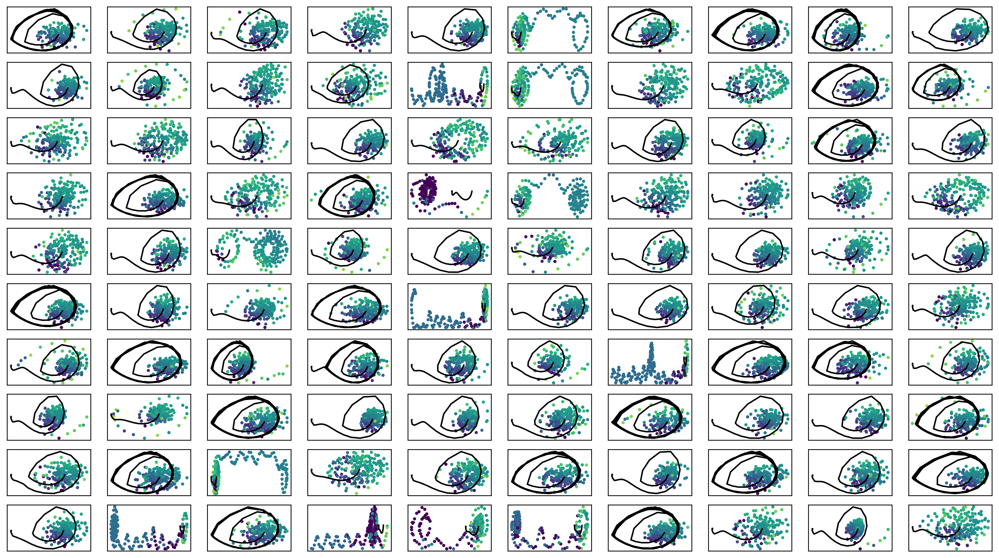

In [13]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [14]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [15]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [16]:
# for i in range(100):
#     print(i, " ", end="")
#     fig = plt.figure(figsize=(16,10), dpi=150)
#     fig.patch.set_facecolor('white')
#     plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#                vmin=-8, vmax=3
#                )
#     plt.colorbar()
#     plt.savefig("ratio"+str(i)+".png")
#     plt.close()

train_weighted_vae: enc_dec
train: iter 0  trainloss -148.55491  validloss -162.91828±0.00000  bestvalidloss -162.91828  last_update 0
train: iter 1  trainloss -154.23184  validloss -161.87731±0.00000  bestvalidloss -162.91828  last_update 1
train: iter 2  trainloss -156.23919  validloss -164.05531±0.00000  bestvalidloss -164.05531  last_update 0
train: iter 3  trainloss -155.58253  validloss -157.16918±0.00000  bestvalidloss -164.05531  last_update 1
train: iter 4  trainloss -154.41045  validloss -161.53611±0.00000  bestvalidloss -164.05531  last_update 2
train: iter 5  trainloss -154.58836  validloss -146.48621±0.00000  bestvalidloss -164.05531  last_update 3
train: iter 6  trainloss -157.94885  validloss -157.42768±0.00000  bestvalidloss -164.05531  last_update 4
train: iter 7  trainloss -147.76711  validloss -159.33120±0.00000  bestvalidloss -164.05531  last_update 5
train: iter 8  trainloss -155.04377  validloss -161.76031±0.00000  bestvalidloss -164.05531  last_update 6
train: it

train: iter 77  trainloss -173.08541  validloss -182.18773±0.00000  bestvalidloss -185.88051  last_update 7
train: iter 78  trainloss -169.47732  validloss -165.75919±0.00000  bestvalidloss -185.88051  last_update 8
train: iter 79  trainloss -173.05085  validloss -176.03410±0.00000  bestvalidloss -185.88051  last_update 9
train: iter 80  trainloss -168.04736  validloss -167.55616±0.00000  bestvalidloss -185.88051  last_update 10
train: iter 81  trainloss -172.83250  validloss -172.51216±0.00000  bestvalidloss -185.88051  last_update 11
train: iter 82  trainloss -172.91753  validloss -166.90373±0.00000  bestvalidloss -185.88051  last_update 12
train: iter 83  trainloss -173.87804  validloss -184.64331±0.00000  bestvalidloss -185.88051  last_update 13
train: iter 84  trainloss -164.63491  validloss -162.25359±0.00000  bestvalidloss -185.88051  last_update 14
train: iter 85  trainloss -175.98696  validloss -172.26612±0.00000  bestvalidloss -185.88051  last_update 15
train: iter 86  trainl

train: iter 153  trainloss -195.33887  validloss -206.58471±0.00000  bestvalidloss -206.58471  last_update 0
train: iter 154  trainloss -188.10278  validloss -197.55104±0.00000  bestvalidloss -206.58471  last_update 1
train: iter 155  trainloss -200.92572  validloss -192.73911±0.00000  bestvalidloss -206.58471  last_update 2
train: iter 156  trainloss -198.40042  validloss -178.65198±0.00000  bestvalidloss -206.58471  last_update 3
train: iter 157  trainloss -195.98905  validloss -204.48719±0.00000  bestvalidloss -206.58471  last_update 4
train: iter 158  trainloss -201.79620  validloss -206.86628±0.00000  bestvalidloss -206.86628  last_update 0
train: iter 159  trainloss -196.54725  validloss -201.26653±0.00000  bestvalidloss -206.86628  last_update 1
train: iter 160  trainloss -190.56699  validloss -197.90843±0.00000  bestvalidloss -206.86628  last_update 2
train: iter 161  trainloss -203.53672  validloss -213.46742±0.00000  bestvalidloss -213.46742  last_update 0
train: iter 162  tr

train: iter 229  trainloss -217.77426  validloss -215.90508±0.00000  bestvalidloss -222.01569  last_update 8
train: iter 230  trainloss -221.19719  validloss -222.79963±0.00000  bestvalidloss -222.79963  last_update 0
train: iter 231  trainloss -218.54799  validloss -204.36768±0.00000  bestvalidloss -222.79963  last_update 1
train: iter 232  trainloss -222.16328  validloss -220.63981±0.00000  bestvalidloss -222.79963  last_update 2
train: iter 233  trainloss -224.05394  validloss -223.08640±0.00000  bestvalidloss -223.08640  last_update 0
train: iter 234  trainloss -220.04604  validloss -209.78096±0.00000  bestvalidloss -223.08640  last_update 1
train: iter 235  trainloss -214.76992  validloss -227.26990±0.00000  bestvalidloss -227.26990  last_update 0
train: iter 236  trainloss -216.59495  validloss -196.59451±0.00000  bestvalidloss -227.26990  last_update 1
train: iter 237  trainloss -224.21157  validloss -227.25177±0.00000  bestvalidloss -227.26990  last_update 2
train: iter 238  tr

train: iter 305  trainloss -233.93922  validloss -244.19337±0.00000  bestvalidloss -244.19337  last_update 0
train: iter 306  trainloss -238.66946  validloss -247.55611±0.00000  bestvalidloss -247.55611  last_update 0
train: iter 307  trainloss -242.07476  validloss -234.60410±0.00000  bestvalidloss -247.55611  last_update 1
train: iter 308  trainloss -243.01068  validloss -237.79728±0.00000  bestvalidloss -247.55611  last_update 2
train: iter 309  trainloss -237.58448  validloss -232.10933±0.00000  bestvalidloss -247.55611  last_update 3
train: iter 310  trainloss -240.88251  validloss -229.48726±0.00000  bestvalidloss -247.55611  last_update 4
train: iter 311  trainloss -237.65410  validloss -226.93502±0.00000  bestvalidloss -247.55611  last_update 5
train: iter 312  trainloss -239.81132  validloss -243.22097±0.00000  bestvalidloss -247.55611  last_update 6
train: iter 313  trainloss -239.88370  validloss -239.24521±0.00000  bestvalidloss -247.55611  last_update 7
train: iter 314  tr

train: iter 380  trainloss -258.33864  validloss -243.48597±0.00000  bestvalidloss -258.98606  last_update 4
train: iter 381  trainloss -256.29681  validloss -236.13573±0.00000  bestvalidloss -258.98606  last_update 5
train: iter 382  trainloss -254.84598  validloss -238.44491±0.00000  bestvalidloss -258.98606  last_update 6
train: iter 383  trainloss -254.22409  validloss -258.71467±0.00000  bestvalidloss -258.98606  last_update 7
train: iter 384  trainloss -252.33011  validloss -225.14788±0.00000  bestvalidloss -258.98606  last_update 8
train: iter 385  trainloss -262.47331  validloss -262.25144±0.00000  bestvalidloss -262.25144  last_update 0
train: iter 386  trainloss -253.22203  validloss -248.69410±0.00000  bestvalidloss -262.25144  last_update 1
train: iter 387  trainloss -253.00640  validloss -255.47261±0.00000  bestvalidloss -262.25144  last_update 2
train: iter 388  trainloss -256.92381  validloss -244.40985±0.00000  bestvalidloss -262.25144  last_update 3
train: iter 389  tr

train: iter 456  trainloss -264.05129  validloss -252.02609±0.00000  bestvalidloss -262.25144  last_update 71
train: iter 457  trainloss -264.69784  validloss -241.64080±0.00000  bestvalidloss -262.25144  last_update 72
train: iter 458  trainloss -265.69285  validloss -241.25959±0.00000  bestvalidloss -262.25144  last_update 73
train: iter 459  trainloss -266.48596  validloss -249.91710±0.00000  bestvalidloss -262.25144  last_update 74
train: iter 460  trainloss -263.99546  validloss -246.57212±0.00000  bestvalidloss -262.25144  last_update 75
train: iter 461  trainloss -266.81748  validloss -208.91872±0.00000  bestvalidloss -262.25144  last_update 76
train: iter 462  trainloss -266.49735  validloss -225.23443±0.00000  bestvalidloss -262.25144  last_update 77
train: iter 463  trainloss -259.64744  validloss -243.73576±0.00000  bestvalidloss -262.25144  last_update 78
train: iter 464  trainloss -263.78573  validloss -247.88275±0.00000  bestvalidloss -262.25144  last_update 79
train: ite

train: iter 532  trainloss -274.83998  validloss -254.98003±0.00000  bestvalidloss -270.81513  last_update 11
train: iter 533  trainloss -272.59479  validloss -264.43648±0.00000  bestvalidloss -270.81513  last_update 12
train: iter 534  trainloss -269.67202  validloss -229.38730±0.00000  bestvalidloss -270.81513  last_update 13
train: iter 535  trainloss -277.88580  validloss -266.80597±0.00000  bestvalidloss -270.81513  last_update 14
train: iter 536  trainloss -276.78376  validloss -262.38773±0.00000  bestvalidloss -270.81513  last_update 15
train: iter 537  trainloss -276.48183  validloss -255.89519±0.00000  bestvalidloss -270.81513  last_update 16
train: iter 538  trainloss -276.97545  validloss -264.26129±0.00000  bestvalidloss -270.81513  last_update 17
train: iter 539  trainloss -258.40933  validloss -243.70946±0.00000  bestvalidloss -270.81513  last_update 18
train: iter 540  trainloss -275.41352  validloss -245.23416±0.00000  bestvalidloss -270.81513  last_update 19
train: ite

train: iter 607  trainloss -281.07842  validloss -259.97527±0.00000  bestvalidloss -279.98241  last_update 13
train: iter 608  trainloss -277.95043  validloss -256.05316±0.00000  bestvalidloss -279.98241  last_update 14
train: iter 609  trainloss -282.97195  validloss -244.95909±0.00000  bestvalidloss -279.98241  last_update 15
train: iter 610  trainloss -279.00544  validloss -268.66760±0.00000  bestvalidloss -279.98241  last_update 16
train: iter 611  trainloss -290.34309  validloss -273.29150±0.00000  bestvalidloss -279.98241  last_update 17
train: iter 612  trainloss -284.77611  validloss -278.03895±0.00000  bestvalidloss -279.98241  last_update 18
train: iter 613  trainloss -283.39684  validloss -258.53641±0.00000  bestvalidloss -279.98241  last_update 19
train: iter 614  trainloss -284.67669  validloss -246.07145±0.00000  bestvalidloss -279.98241  last_update 20
train: iter 615  trainloss -286.26735  validloss -258.16767±0.00000  bestvalidloss -279.98241  last_update 21
train: ite

train: iter 682  trainloss -291.11152  validloss -271.39464±0.00000  bestvalidloss -280.78157  last_update 43
train: iter 683  trainloss -291.58527  validloss -254.52681±0.00000  bestvalidloss -280.78157  last_update 44
train: iter 684  trainloss -285.26778  validloss -274.67199±0.00000  bestvalidloss -280.78157  last_update 45
train: iter 685  trainloss -294.24651  validloss -280.46614±0.00000  bestvalidloss -280.78157  last_update 46
train: iter 686  trainloss -294.09588  validloss -218.09311±0.00000  bestvalidloss -280.78157  last_update 47
train: iter 687  trainloss -292.18384  validloss -269.09062±0.00000  bestvalidloss -280.78157  last_update 48
train: iter 688  trainloss -292.54867  validloss -271.23621±0.00000  bestvalidloss -280.78157  last_update 49
train: iter 689  trainloss -285.28607  validloss -256.30742±0.00000  bestvalidloss -280.78157  last_update 50
train: iter 690  trainloss -297.18138  validloss -273.21607±0.00000  bestvalidloss -280.78157  last_update 51
train: ite

train: iter 758  trainloss -299.50923  validloss -259.91125±0.00000  bestvalidloss -285.58738  last_update 22
train: iter 759  trainloss -290.24629  validloss -256.97864±0.00000  bestvalidloss -285.58738  last_update 23
train: iter 760  trainloss -278.20041  validloss -280.44873±0.00000  bestvalidloss -285.58738  last_update 24
train: iter 761  trainloss -291.62263  validloss -266.80160±0.00000  bestvalidloss -285.58738  last_update 25
train: iter 762  trainloss -290.46199  validloss -272.37385±0.00000  bestvalidloss -285.58738  last_update 26
train: iter 763  trainloss -295.69939  validloss -262.54631±0.00000  bestvalidloss -285.58738  last_update 27
train: iter 764  trainloss -289.53389  validloss -256.92143±0.00000  bestvalidloss -285.58738  last_update 28
train: iter 765  trainloss -292.41303  validloss -196.90429±0.00000  bestvalidloss -285.58738  last_update 29
train: iter 766  trainloss -293.42733  validloss -271.67474±0.00000  bestvalidloss -285.58738  last_update 30
train: ite

train: iter 833  trainloss -297.18276  validloss -270.40372±0.00000  bestvalidloss -287.73230  last_update 15
train: iter 834  trainloss -299.74514  validloss -278.67235±0.00000  bestvalidloss -287.73230  last_update 16
train: iter 835  trainloss -300.68159  validloss -271.32318±0.00000  bestvalidloss -287.73230  last_update 17
train: iter 836  trainloss -297.39502  validloss -256.52919±0.00000  bestvalidloss -287.73230  last_update 18
train: iter 837  trainloss -296.94064  validloss -250.65698±0.00000  bestvalidloss -287.73230  last_update 19
train: iter 838  trainloss -302.75340  validloss -234.52408±0.00000  bestvalidloss -287.73230  last_update 20
train: iter 839  trainloss -306.27348  validloss -276.15153±0.00000  bestvalidloss -287.73230  last_update 21
train: iter 840  trainloss -301.26809  validloss -275.50057±0.00000  bestvalidloss -287.73230  last_update 22
train: iter 841  trainloss -300.13833  validloss -236.78154±0.00000  bestvalidloss -287.73230  last_update 23
train: ite

train: iter 909  trainloss -297.67139  validloss -251.86682±0.00000  bestvalidloss -293.12120  last_update 31
train: iter 910  trainloss -306.74801  validloss -232.59498±0.00000  bestvalidloss -293.12120  last_update 32
train: iter 911  trainloss -303.28856  validloss -275.59294±0.00000  bestvalidloss -293.12120  last_update 33
train: iter 912  trainloss -302.41578  validloss -280.99499±0.00000  bestvalidloss -293.12120  last_update 34
train: iter 913  trainloss -289.12795  validloss -280.03790±0.00000  bestvalidloss -293.12120  last_update 35
train: iter 914  trainloss -313.69962  validloss -299.11937±0.00000  bestvalidloss -299.11937  last_update 0
train: iter 915  trainloss -309.15820  validloss -286.90236±0.00000  bestvalidloss -299.11937  last_update 1
train: iter 916  trainloss -308.17412  validloss -276.65936±0.00000  bestvalidloss -299.11937  last_update 2
train: iter 917  trainloss -305.62312  validloss -273.77811±0.00000  bestvalidloss -299.11937  last_update 3
train: iter 91

train: iter 984  trainloss -301.73097  validloss -287.74451±0.00000  bestvalidloss -299.49702  last_update 55
train: iter 985  trainloss -319.65345  validloss -295.22099±0.00000  bestvalidloss -299.49702  last_update 56
train: iter 986  trainloss -315.35039  validloss -294.79849±0.00000  bestvalidloss -299.49702  last_update 57
train: iter 987  trainloss -314.77234  validloss -240.45946±0.00000  bestvalidloss -299.49702  last_update 58
train: iter 988  trainloss -316.08941  validloss -280.42474±0.00000  bestvalidloss -299.49702  last_update 59
train: iter 989  trainloss -313.15739  validloss -270.00727±0.00000  bestvalidloss -299.49702  last_update 60
train: iter 990  trainloss -308.17572  validloss -269.73943±0.00000  bestvalidloss -299.49702  last_update 61
train: iter 991  trainloss -307.71639  validloss -262.80572±0.00000  bestvalidloss -299.49702  last_update 62
train: iter 992  trainloss -309.04203  validloss -211.68310±0.00000  bestvalidloss -299.49702  last_update 63
train: ite

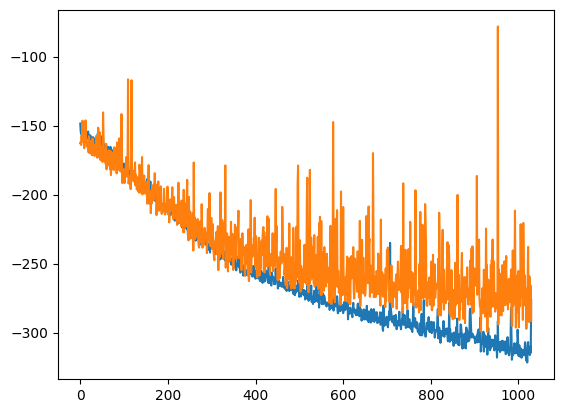

train_weighted_vae: enc
train: iter 0  trainloss -318.33981  validloss -262.45193±0.00000  bestvalidloss -262.45193  last_update 0
train: iter 1  trainloss -327.83154  validloss -309.74274±0.00000  bestvalidloss -309.74274  last_update 0
train: iter 2  trainloss -330.04932  validloss -314.62286±0.00000  bestvalidloss -314.62286  last_update 0
train: iter 3  trainloss -329.20666  validloss -311.98543±0.00000  bestvalidloss -314.62286  last_update 1
train: iter 4  trainloss -331.36237  validloss -313.33558±0.00000  bestvalidloss -314.62286  last_update 2
train: iter 5  trainloss -330.89079  validloss -314.27755±0.00000  bestvalidloss -314.62286  last_update 3
train: iter 6  trainloss -331.11538  validloss -310.01300±0.00000  bestvalidloss -314.62286  last_update 4
train: iter 7  trainloss -331.39574  validloss -310.80117±0.00000  bestvalidloss -314.62286  last_update 5
train: iter 8  trainloss -329.73920  validloss -300.69049±0.00000  bestvalidloss -314.62286  last_update 6
train: iter 9

train: iter 76  trainloss -330.75104  validloss -316.33136±0.00000  bestvalidloss -320.56725  last_update 62
train: iter 77  trainloss -332.07324  validloss -314.52526±0.00000  bestvalidloss -320.56725  last_update 63
train: iter 78  trainloss -331.26451  validloss -319.18096±0.00000  bestvalidloss -320.56725  last_update 64
train: iter 79  trainloss -332.76614  validloss -315.57495±0.00000  bestvalidloss -320.56725  last_update 65
train: iter 80  trainloss -331.78298  validloss -303.43992±0.00000  bestvalidloss -320.56725  last_update 66
train: iter 81  trainloss -327.41532  validloss -318.18908±0.00000  bestvalidloss -320.56725  last_update 67
train: iter 82  trainloss -326.54388  validloss -295.01412±0.00000  bestvalidloss -320.56725  last_update 68
train: iter 83  trainloss -331.13337  validloss -316.77785±0.00000  bestvalidloss -320.56725  last_update 69
train: iter 84  trainloss -331.64238  validloss -307.93892±0.00000  bestvalidloss -320.56725  last_update 70
train: iter 85  tra

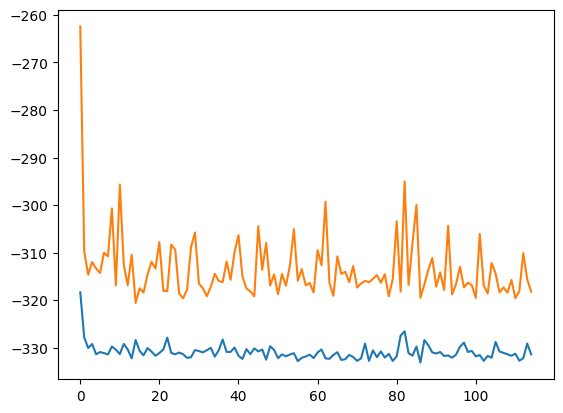

train_weighted_vae: dec
train: iter 0  trainloss -330.09746  validloss -318.19478±0.00000  bestvalidloss -318.19478  last_update 0
train: iter 1  trainloss -333.36506  validloss -301.05894±0.00000  bestvalidloss -318.19478  last_update 1
train: iter 2  trainloss -335.66029  validloss -328.81186±0.00000  bestvalidloss -328.81186  last_update 0
train: iter 3  trainloss -340.23408  validloss -310.56730±0.00000  bestvalidloss -328.81186  last_update 1
train: iter 4  trainloss -341.78299  validloss -310.10389±0.00000  bestvalidloss -328.81186  last_update 2
train: iter 5  trainloss -326.33468  validloss -252.34299±0.00000  bestvalidloss -328.81186  last_update 3
train: iter 6  trainloss -333.74501  validloss -300.11079±0.00000  bestvalidloss -328.81186  last_update 4
train: iter 7  trainloss -337.51634  validloss -318.96128±0.00000  bestvalidloss -328.81186  last_update 5
train: iter 8  trainloss -341.18434  validloss -318.28436±0.00000  bestvalidloss -328.81186  last_update 6
train: iter 9

train: iter 76  trainloss -338.86999  validloss -296.13896±0.00000  bestvalidloss -329.21580  last_update 15
train: iter 77  trainloss -339.39273  validloss -317.80736±0.00000  bestvalidloss -329.21580  last_update 16
train: iter 78  trainloss -338.38616  validloss -290.63241±0.00000  bestvalidloss -329.21580  last_update 17
train: iter 79  trainloss -342.72379  validloss -311.31460±0.00000  bestvalidloss -329.21580  last_update 18
train: iter 80  trainloss -345.20163  validloss -315.43063±0.00000  bestvalidloss -329.21580  last_update 19
train: iter 81  trainloss -340.46898  validloss -308.05789±0.00000  bestvalidloss -329.21580  last_update 20
train: iter 82  trainloss -330.72467  validloss -296.11772±0.00000  bestvalidloss -329.21580  last_update 21
train: iter 83  trainloss -334.98731  validloss -271.80765±0.00000  bestvalidloss -329.21580  last_update 22
train: iter 84  trainloss -344.55469  validloss -324.12037±0.00000  bestvalidloss -329.21580  last_update 23
train: iter 85  tra

train: iter 151  trainloss -341.02080  validloss -293.74442±0.00000  bestvalidloss -330.04103  last_update 24
train: iter 152  trainloss -344.79012  validloss -316.90438±0.00000  bestvalidloss -330.04103  last_update 25
train: iter 153  trainloss -343.74990  validloss -319.94271±0.00000  bestvalidloss -330.04103  last_update 26
train: iter 154  trainloss -343.46495  validloss -307.25114±0.00000  bestvalidloss -330.04103  last_update 27
train: iter 155  trainloss -343.19309  validloss -291.72598±0.00000  bestvalidloss -330.04103  last_update 28
train: iter 156  trainloss -344.63900  validloss -307.65288±0.00000  bestvalidloss -330.04103  last_update 29
train: iter 157  trainloss -344.28109  validloss -304.89267±0.00000  bestvalidloss -330.04103  last_update 30
train: iter 158  trainloss -343.23796  validloss -320.94987±0.00000  bestvalidloss -330.04103  last_update 31
train: iter 159  trainloss -347.99731  validloss -316.30259±0.00000  bestvalidloss -330.04103  last_update 32
train: ite

train: iter 226  trainloss -345.66653  validloss -323.54103±0.00000  bestvalidloss -330.04103  last_update 99
train: iter 227  trainloss -345.59138  validloss -300.04197±0.00000  bestvalidloss -330.04103  last_update 100
train: fin


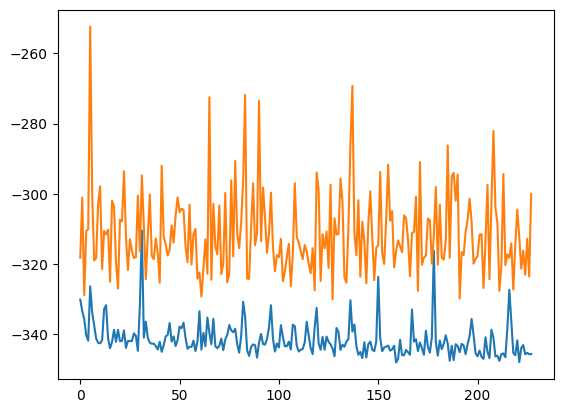

alpha 0.3 vae_lr 0.0005


In [17]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

0  c = 0.14637086416137168
1  c = 0.14958754227132484
2  c = 0.10377879598762563
3  c = 0.11522497561967464
4  c = 0.014651445733084967
5  c = 0.2724189324268187
6  c = 0.24067575553558856
7  c = 0.16039779280060013
8  c = 0.1858126778775297
9  c = 0.23343564188706806
10  c = 0.25442966345295354
11  c = 0.10723865580490931
12  c = 0.12693462993613333
13  c = 0.2583874508759422
14  c = 0.10747459186091313
15  c = 0.05424638324465967
16  c = 0.2916759010021025
17  c = 0.0314349456224153
18  c = 0.14255970475518692
19  c = 0.045711780678007075
20  c = 0.1742505406059054
21  c = 0.11969438969478374
22  c = 0.06130293711325025
23  c = 0.2689577509504183
24  c = 0.1882267267495514
25  c = 0.1488736599228234
26  c = 0.27055040121696783
27  c = 0.0909453523261825
28  c = 0.22082650965733186
29  c = 0.24920563291372733
30  c = 0.11277852283941019
31  c = 0.26333948795277096
32  c = 0.2903392694550849
33  c = 0.16779871624473017
34  c = 0.016633082017112888
35  c = 0.27911312425912377
36  c = 0.

96  c = 0.13412612878501648
97  c = 0.030557315517979355
98  c = 0.1344102576611782
99  c = 0.2516303871812853
 
実環境方策rollout vs Sim環境方策rollout


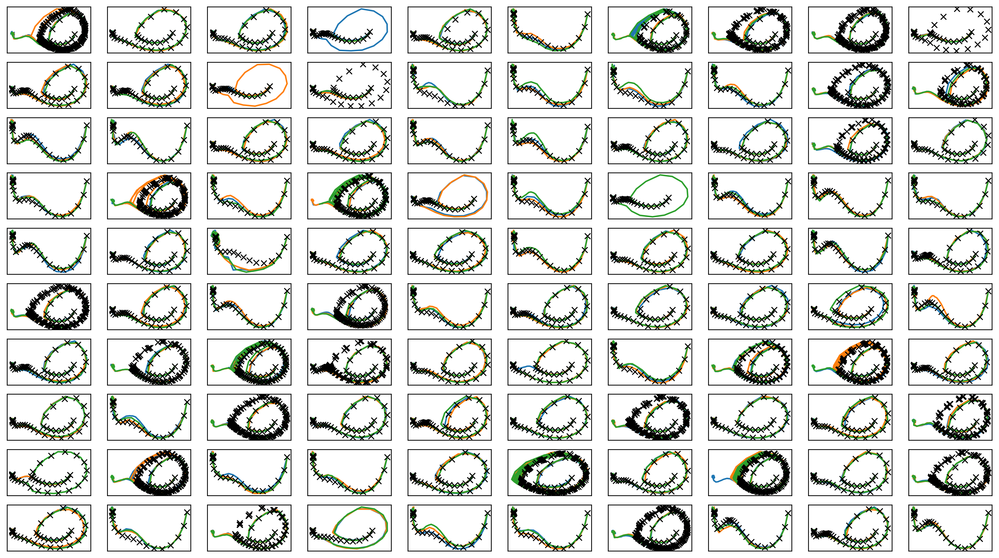

In [18]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter1.png")
plt.savefig(figfilenamehead+"joint_iter1.eps")
plt.savefig(figfilenamehead+"joint_iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

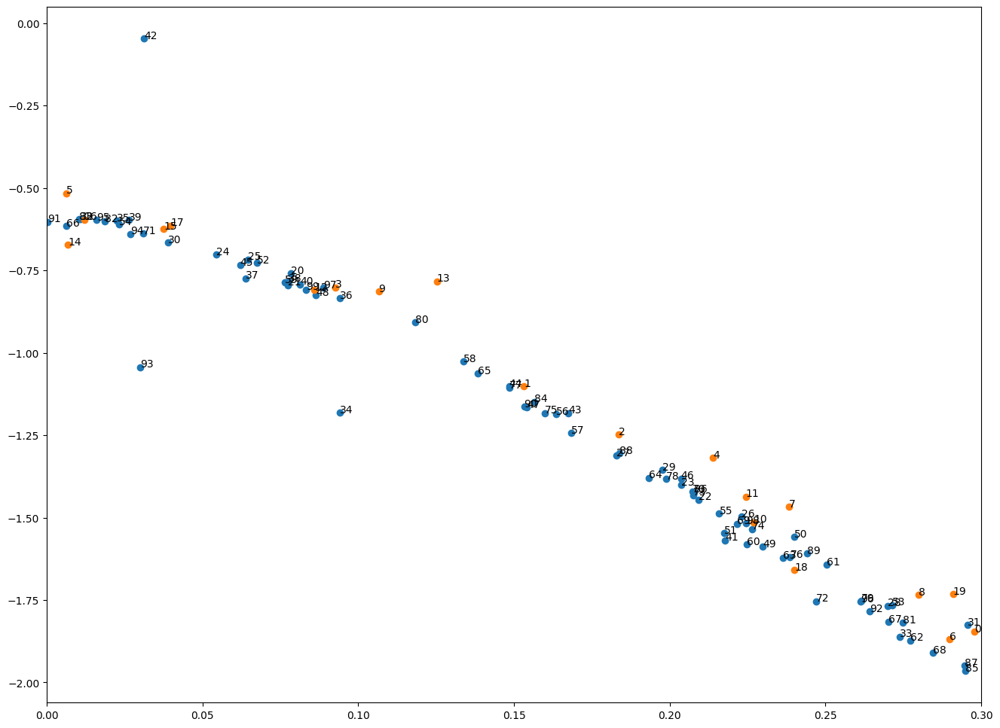

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [19]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [20]:
print(datetime.datetime.now())

2023-04-12 13:31:33.467255


# Iter2

In [21]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  c = 0.2742245679547049
c = 0.07886887903868657
c = 0.005971300632675103
c = 0.27183085816470665
1  c = 0.06920196397805949
c = 0.052874960093473554
c = 0.2964652828744984
c = 0.2810229672050532
c = 0.17256210367102548
c = 0.19544335354875783
c = 0.0916588223111343
c = 0.2373584533893363
c = 0.09217199218200424
2  c = 0.2824788524066624
c = 0.2634066127956125
c = 0.20166704846108593
c = 0.17530668203562488
c = 0.20990346306623167
c = 0.20301584002950776
c = 0.273210913076011
c = 0.02443423835075137
c = 0.21569280547918301
c = 0.14181785737931116
c = 0.1206436932721418
3  c = 0.003273217008350615
c = 0.20020602382576488
c = 0.25564547337762833
c = 0.13961283560869103
c = 0.20525536835344546
c = 0.008251337717963625
c = 0.02061133489971476
c = 0.03592619144223268
c = 0.14813838735218895
c = 0.27671406025127576
c = 0.028983975444654374
c = 0.2643626458381438
4  c = 0.23946218411420916
c = 0.15643759307176636
c = 0.26458373687243625
c = 0.12714233597653743
c = 0.29743924985773035
5  c = 

c = 0.1168055112663542
c = 0.2734997669475278
c = 0.2361175143254151
39  c = 0.0980860140635212
c = 0.1399194468851377
c = 0.19138208276162233
c = 0.06583737406349467
c = 0.1448371104402206
c = 0.26339105882251657
c = 0.06390743736940233
c = 0.006467515378924404
c = 0.20035843254803617
c = 0.08051351109044814
c = 0.019337140201892044
c = 0.043358490866719314
40  c = 0.22514357785111458
c = 0.29355336716848596
c = 0.26968142901118697
c = 0.29007597147098685
c = 0.21466365126635775
41  c = 0.19374946426179226
c = 0.14803236979661658
c = 0.25261466271339245
c = 0.08224870466899098
c = 0.11960977706543113
c = 0.1699783888542235
c = 0.09420451281006845
42  c = 0.2278887786177639
c = 0.1611449930304604
c = 0.047415094938672596
c = 0.23092988700530298
c = 0.07102459464417096
c = 0.2779822318783711
c = 0.24930491949092654
c = 0.13044252790725977
c = 0.15327198135245326
c = 0.1472868883001213
43  c = 0.2699932634020583
c = 0.2855798871407716
c = 0.11541217822750943
c = 0.06855416302998725
c = 0

c = 0.04415091184576183
c = 0.05011385586612027
79  c = 0.24876990432620819
c = 0.27804158627855907
c = 0.15460740196396255
c = 0.24626380894916572
c = 0.08704602726570147
c = 0.037960689345891085
80  c = 0.25136611900366373
c = 0.2200146338271745
c = 0.15116250777015908
c = 0.22826367077952917
c = 0.21009663982804316
c = 0.14553196581851682
c = 0.2390158507118595
c = 0.2880242294526057
c = 0.08895379363933936
c = 0.07375723564005249
81  c = 0.20822839319762476
c = 0.26822210409066183
c = 0.2608341016019983
c = 0.01477042047049336
c = 0.1745542835979431
c = 0.2543036007510837
c = 0.2807644531523845
c = 0.2770901108398531
c = 0.19062194636673846
c = 0.09927164107798263
82  c = 0.13410946871246224
c = 0.1953121717101066
c = 0.2013896151335297
83  c = 0.2117959669506514
c = 0.24365884852411748
c = 0.22293266830393543
c = 0.0032608975467953603
c = 0.09176826669584205
c = 0.013283716234591224
c = 0.2794126838364988
84  c = 0.05116275728574349
c = 0.06490541614007984
c = 0.09323433230222462


In [22]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss 0.25638  validloss 0.34874±0.00000  bestvalidloss 0.34874  last_update 0
train: iter 1  trainloss 0.20234  validloss 0.23746±0.00000  bestvalidloss 0.23746  last_update 0
train: iter 2  trainloss 0.18073  validloss 0.20995±0.00000  bestvalidloss 0.20995  last_update 0
train: iter 3  trainloss 0.17072  validloss 0.20119±0.00000  bestvalidloss 0.20119  last_update 0
train: iter 4  trainloss 0.16496  validloss 0.19563±0.00000  bestvalidloss 0.19563  last_update 0
train: iter 5  trainloss 0.16223  validloss 0.19849±0.00000  bestvalidloss 0.19563  last_update 1
train: iter 6  trainloss 0.15818  validloss 0.19074±0.00000  bestvalidloss 0.19074  last_update 0
train: iter 7  trainloss 0.15664  validloss 0.19488±0.00000  bestvalidloss 0.19074  last_update 1
train: iter 8  trainloss 0.15427  validloss 0.19540±0.00000  bestvalidloss 0.19074  last_update 2
train: iter 9  trainloss 0.15330  validloss 0.18837±0.00000  bestvalidloss 0.18837  last_update 0
train: iter 10  trai

train: iter 84  trainloss 0.13740  validloss 0.17895±0.00000  bestvalidloss 0.17569  last_update 12
train: iter 85  trainloss 0.13874  validloss 0.17787±0.00000  bestvalidloss 0.17569  last_update 13
train: iter 86  trainloss 0.13838  validloss 0.17726±0.00000  bestvalidloss 0.17569  last_update 14
train: iter 87  trainloss 0.13643  validloss 0.17511±0.00000  bestvalidloss 0.17511  last_update 0
train: iter 88  trainloss 0.13748  validloss 0.18051±0.00000  bestvalidloss 0.17511  last_update 1
train: iter 89  trainloss 0.13646  validloss 0.17900±0.00000  bestvalidloss 0.17511  last_update 2
train: iter 90  trainloss 0.13615  validloss 0.17682±0.00000  bestvalidloss 0.17511  last_update 3
train: iter 91  trainloss 0.13732  validloss 0.17502±0.00000  bestvalidloss 0.17502  last_update 0
train: iter 92  trainloss 0.13672  validloss 0.17658±0.00000  bestvalidloss 0.17502  last_update 1
train: iter 93  trainloss 0.13550  validloss 0.17519±0.00000  bestvalidloss 0.17502  last_update 2
train: 

train: iter 168  trainloss 0.13353  validloss 0.17834±0.00000  bestvalidloss 0.17224  last_update 2
train: iter 169  trainloss 0.13262  validloss 0.17462±0.00000  bestvalidloss 0.17224  last_update 3
train: iter 170  trainloss 0.13482  validloss 0.17758±0.00000  bestvalidloss 0.17224  last_update 4
train: iter 171  trainloss 0.13204  validloss 0.17667±0.00000  bestvalidloss 0.17224  last_update 5
train: iter 172  trainloss 0.13282  validloss 0.17761±0.00000  bestvalidloss 0.17224  last_update 6
train: iter 173  trainloss 0.13389  validloss 0.17384±0.00000  bestvalidloss 0.17224  last_update 7
train: iter 174  trainloss 0.13284  validloss 0.17218±0.00000  bestvalidloss 0.17218  last_update 0
train: iter 175  trainloss 0.13417  validloss 0.17234±0.00000  bestvalidloss 0.17218  last_update 1
train: iter 176  trainloss 0.13254  validloss 0.17303±0.00000  bestvalidloss 0.17218  last_update 2
train: iter 177  trainloss 0.13269  validloss 0.17517±0.00000  bestvalidloss 0.17218  last_update 3


train: iter 252  trainloss 0.13123  validloss 0.17183±0.00000  bestvalidloss 0.17025  last_update 6
train: iter 253  trainloss 0.13207  validloss 0.17009±0.00000  bestvalidloss 0.17009  last_update 0
train: iter 254  trainloss 0.13085  validloss 0.17288±0.00000  bestvalidloss 0.17009  last_update 1
train: iter 255  trainloss 0.13223  validloss 0.17172±0.00000  bestvalidloss 0.17009  last_update 2
train: iter 256  trainloss 0.13339  validloss 0.17521±0.00000  bestvalidloss 0.17009  last_update 3
train: iter 257  trainloss 0.13165  validloss 0.17113±0.00000  bestvalidloss 0.17009  last_update 4
train: iter 258  trainloss 0.13055  validloss 0.17251±0.00000  bestvalidloss 0.17009  last_update 5
train: iter 259  trainloss 0.13178  validloss 0.17176±0.00000  bestvalidloss 0.17009  last_update 6
train: iter 260  trainloss 0.13364  validloss 0.17211±0.00000  bestvalidloss 0.17009  last_update 7
train: iter 261  trainloss 0.13081  validloss 0.17245±0.00000  bestvalidloss 0.17009  last_update 8


train: iter 336  trainloss 0.12937  validloss 0.17389±0.00000  bestvalidloss 0.16900  last_update 37
train: iter 337  trainloss 0.12893  validloss 0.16987±0.00000  bestvalidloss 0.16900  last_update 38
train: iter 338  trainloss 0.12979  validloss 0.17180±0.00000  bestvalidloss 0.16900  last_update 39
train: iter 339  trainloss 0.12901  validloss 0.16937±0.00000  bestvalidloss 0.16900  last_update 40
train: iter 340  trainloss 0.13072  validloss 0.17137±0.00000  bestvalidloss 0.16900  last_update 41
train: iter 341  trainloss 0.13047  validloss 0.16934±0.00000  bestvalidloss 0.16900  last_update 42
train: iter 342  trainloss 0.12909  validloss 0.17236±0.00000  bestvalidloss 0.16900  last_update 43
train: iter 343  trainloss 0.12984  validloss 0.18268±0.00000  bestvalidloss 0.16900  last_update 44
train: iter 344  trainloss 0.12923  validloss 0.16973±0.00000  bestvalidloss 0.16900  last_update 45
train: iter 345  trainloss 0.13052  validloss 0.17199±0.00000  bestvalidloss 0.16900  last_

train: iter 420  trainloss 0.12973  validloss 0.17058±0.00000  bestvalidloss 0.16841  last_update 43
train: iter 421  trainloss 0.12840  validloss 0.16953±0.00000  bestvalidloss 0.16841  last_update 44
train: iter 422  trainloss 0.12839  validloss 0.17113±0.00000  bestvalidloss 0.16841  last_update 45
train: iter 423  trainloss 0.12900  validloss 0.17187±0.00000  bestvalidloss 0.16841  last_update 46
train: iter 424  trainloss 0.12905  validloss 0.17118±0.00000  bestvalidloss 0.16841  last_update 47
train: iter 425  trainloss 0.12822  validloss 0.17065±0.00000  bestvalidloss 0.16841  last_update 48
train: iter 426  trainloss 0.12911  validloss 0.16845±0.00000  bestvalidloss 0.16841  last_update 49
train: iter 427  trainloss 0.13066  validloss 0.17087±0.00000  bestvalidloss 0.16841  last_update 50
train: iter 428  trainloss 0.12857  validloss 0.17036±0.00000  bestvalidloss 0.16841  last_update 51
train: iter 429  trainloss 0.12884  validloss 0.17128±0.00000  bestvalidloss 0.16841  last_

train: iter 504  trainloss 0.12678  validloss 0.16814±0.00000  bestvalidloss 0.16724  last_update 3
train: iter 505  trainloss 0.12659  validloss 0.17049±0.00000  bestvalidloss 0.16724  last_update 4
train: iter 506  trainloss 0.12752  validloss 0.16795±0.00000  bestvalidloss 0.16724  last_update 5
train: iter 507  trainloss 0.12781  validloss 0.17438±0.00000  bestvalidloss 0.16724  last_update 6
train: iter 508  trainloss 0.12658  validloss 0.16939±0.00000  bestvalidloss 0.16724  last_update 7
train: iter 509  trainloss 0.12697  validloss 0.16732±0.00000  bestvalidloss 0.16724  last_update 8
train: iter 510  trainloss 0.12869  validloss 0.17149±0.00000  bestvalidloss 0.16724  last_update 9
train: iter 511  trainloss 0.12907  validloss 0.17815±0.00000  bestvalidloss 0.16724  last_update 10
train: iter 512  trainloss 0.12726  validloss 0.17212±0.00000  bestvalidloss 0.16724  last_update 11
train: iter 513  trainloss 0.12692  validloss 0.17098±0.00000  bestvalidloss 0.16724  last_update 

train: iter 588  trainloss 0.12607  validloss 0.17338±0.00000  bestvalidloss 0.16706  last_update 2
train: iter 589  trainloss 0.12647  validloss 0.17173±0.00000  bestvalidloss 0.16706  last_update 3
train: iter 590  trainloss 0.12661  validloss 0.16881±0.00000  bestvalidloss 0.16706  last_update 4
train: iter 591  trainloss 0.12842  validloss 0.17665±0.00000  bestvalidloss 0.16706  last_update 5
train: iter 592  trainloss 0.12666  validloss 0.17437±0.00000  bestvalidloss 0.16706  last_update 6
train: iter 593  trainloss 0.12670  validloss 0.16767±0.00000  bestvalidloss 0.16706  last_update 7
train: iter 594  trainloss 0.13006  validloss 0.16900±0.00000  bestvalidloss 0.16706  last_update 8
train: iter 595  trainloss 0.12677  validloss 0.17090±0.00000  bestvalidloss 0.16706  last_update 9
train: iter 596  trainloss 0.12662  validloss 0.17016±0.00000  bestvalidloss 0.16706  last_update 10
train: iter 597  trainloss 0.12655  validloss 0.17179±0.00000  bestvalidloss 0.16706  last_update 1

train: iter 672  trainloss 0.12577  validloss 0.17088±0.00000  bestvalidloss 0.16616  last_update 7
train: iter 673  trainloss 0.12542  validloss 0.16785±0.00000  bestvalidloss 0.16616  last_update 8
train: iter 674  trainloss 0.12528  validloss 0.16961±0.00000  bestvalidloss 0.16616  last_update 9
train: iter 675  trainloss 0.12654  validloss 0.16880±0.00000  bestvalidloss 0.16616  last_update 10
train: iter 676  trainloss 0.12614  validloss 0.17036±0.00000  bestvalidloss 0.16616  last_update 11
train: iter 677  trainloss 0.12487  validloss 0.16965±0.00000  bestvalidloss 0.16616  last_update 12
train: iter 678  trainloss 0.12660  validloss 0.17372±0.00000  bestvalidloss 0.16616  last_update 13
train: iter 679  trainloss 0.12649  validloss 0.17967±0.00000  bestvalidloss 0.16616  last_update 14
train: iter 680  trainloss 0.12466  validloss 0.16628±0.00000  bestvalidloss 0.16616  last_update 15
train: iter 681  trainloss 0.12474  validloss 0.16851±0.00000  bestvalidloss 0.16616  last_upd

train: iter 756  trainloss 0.12472  validloss 0.16816±0.00000  bestvalidloss 0.16616  last_update 91
train: iter 757  trainloss 0.12614  validloss 0.17539±0.00000  bestvalidloss 0.16616  last_update 92
train: iter 758  trainloss 0.12611  validloss 0.17260±0.00000  bestvalidloss 0.16616  last_update 93
train: iter 759  trainloss 0.12387  validloss 0.16732±0.00000  bestvalidloss 0.16616  last_update 94
train: iter 760  trainloss 0.12473  validloss 0.16658±0.00000  bestvalidloss 0.16616  last_update 95
train: iter 761  trainloss 0.12473  validloss 0.16651±0.00000  bestvalidloss 0.16616  last_update 96
train: iter 762  trainloss 0.12555  validloss 0.16659±0.00000  bestvalidloss 0.16616  last_update 97
train: iter 763  trainloss 0.12635  validloss 0.17935±0.00000  bestvalidloss 0.16616  last_update 98
train: iter 764  trainloss 0.12473  validloss 0.17009±0.00000  bestvalidloss 0.16616  last_update 99
train: iter 765  trainloss 0.12431  validloss 0.16685±0.00000  bestvalidloss 0.16616  last_

In [23]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -132.15013684391974
valid_loss:  -162.6041570115089
train_loss:  -169.43583757162094
valid_loss:  -148.7953001713753


1e-08 1000.0


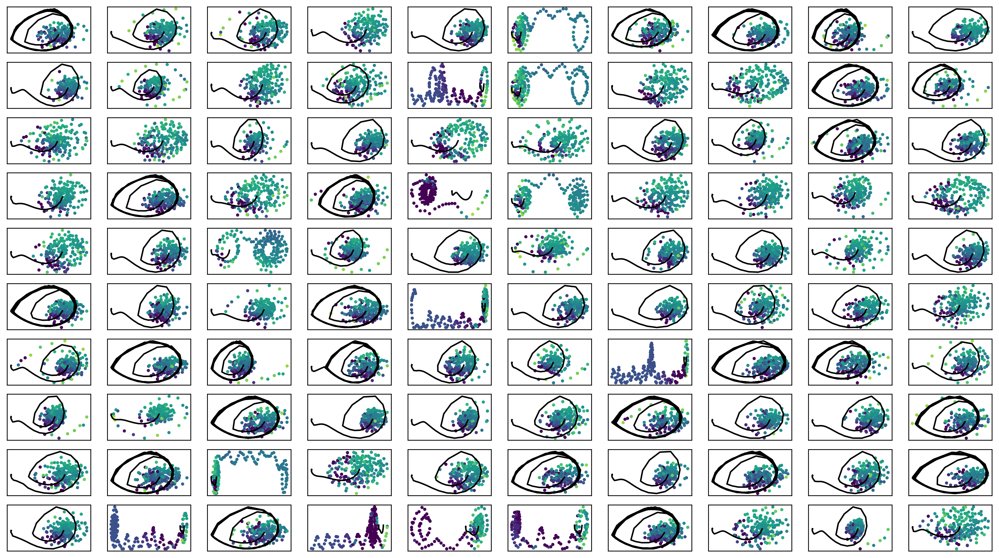

In [24]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [25]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [26]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


train_weighted_vae: enc_dec
train: iter 0  trainloss -163.12034  validloss -147.16766±0.00000  bestvalidloss -147.16766  last_update 0
train: iter 1  trainloss -168.72411  validloss -155.83569±0.00000  bestvalidloss -155.83569  last_update 0
train: iter 2  trainloss -166.66192  validloss -165.19501±0.00000  bestvalidloss -165.19501  last_update 0
train: iter 3  trainloss -156.65671  validloss -174.70323±0.00000  bestvalidloss -174.70323  last_update 0
train: iter 4  trainloss -169.13955  validloss -153.53176±0.00000  bestvalidloss -174.70323  last_update 1
train: iter 5  trainloss -168.20481  validloss -157.87026±0.00000  bestvalidloss -174.70323  last_update 2
train: iter 6  trainloss -170.08112  validloss -160.79483±0.00000  bestvalidloss -174.70323  last_update 3
train: iter 7  trainloss -167.74621  validloss -148.72661±0.00000  bestvalidloss -174.70323  last_update 4
train: iter 8  trainloss -164.01664  validloss -156.78638±0.00000  bestvalidloss -174.70323  last_update 5
train: it

train: iter 77  trainloss -171.73775  validloss -150.80374±0.00000  bestvalidloss -183.49173  last_update 25
train: iter 78  trainloss -171.72807  validloss -155.00251±0.00000  bestvalidloss -183.49173  last_update 26
train: iter 79  trainloss -168.22297  validloss -120.87159±0.00000  bestvalidloss -183.49173  last_update 27
train: iter 80  trainloss -172.75345  validloss -149.64406±0.00000  bestvalidloss -183.49173  last_update 28
train: iter 81  trainloss -170.42066  validloss -164.06068±0.00000  bestvalidloss -183.49173  last_update 29
train: iter 82  trainloss -173.38748  validloss -134.03545±0.00000  bestvalidloss -183.49173  last_update 30
train: iter 83  trainloss -169.79422  validloss -134.13358±0.00000  bestvalidloss -183.49173  last_update 31
train: iter 84  trainloss -176.05596  validloss -159.21070±0.00000  bestvalidloss -183.49173  last_update 32
train: iter 85  trainloss -167.27903  validloss -125.58952±0.00000  bestvalidloss -183.49173  last_update 33
train: iter 86  tra

train: iter 152  trainloss -169.13896  validloss -165.86895±0.00000  bestvalidloss -183.49173  last_update 100
train: fin


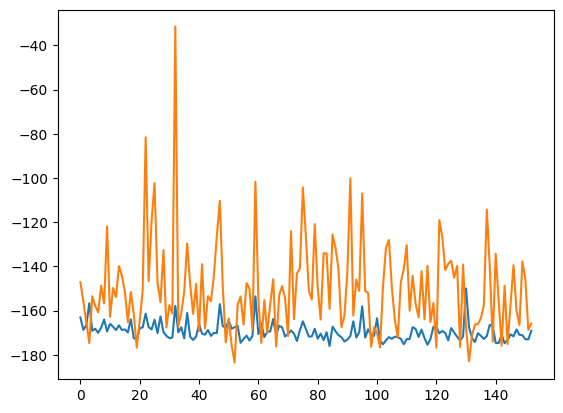

train_weighted_vae: enc
train: iter 0  trainloss -165.02829  validloss -146.53962±0.00000  bestvalidloss -146.53962  last_update 0
train: iter 1  trainloss -161.23981  validloss -160.31414±0.00000  bestvalidloss -160.31414  last_update 0
train: iter 2  trainloss -167.31356  validloss -155.75730±0.00000  bestvalidloss -160.31414  last_update 1
train: iter 3  trainloss -167.51636  validloss -138.03712±0.00000  bestvalidloss -160.31414  last_update 2
train: iter 4  trainloss -167.92674  validloss -140.11675±0.00000  bestvalidloss -160.31414  last_update 3
train: iter 5  trainloss -168.44616  validloss -143.13922±0.00000  bestvalidloss -160.31414  last_update 4
train: iter 6  trainloss -167.92157  validloss -128.94053±0.00000  bestvalidloss -160.31414  last_update 5
train: iter 7  trainloss -166.66077  validloss -142.61145±0.00000  bestvalidloss -160.31414  last_update 6
train: iter 8  trainloss -166.10614  validloss -162.94716±0.00000  bestvalidloss -162.94716  last_update 0
train: iter 9

train: iter 77  trainloss -162.80065  validloss -115.66945±0.00000  bestvalidloss -167.86522  last_update 37
train: iter 78  trainloss -165.93385  validloss -147.98341±0.00000  bestvalidloss -167.86522  last_update 38
train: iter 79  trainloss -165.29092  validloss -136.14629±0.00000  bestvalidloss -167.86522  last_update 39
train: iter 80  trainloss -163.66712  validloss -160.20213±0.00000  bestvalidloss -167.86522  last_update 40
train: iter 81  trainloss -167.66171  validloss -154.95559±0.00000  bestvalidloss -167.86522  last_update 41
train: iter 82  trainloss -167.79583  validloss -143.27631±0.00000  bestvalidloss -167.86522  last_update 42
train: iter 83  trainloss -167.85336  validloss -171.35464±0.00000  bestvalidloss -171.35464  last_update 0
train: iter 84  trainloss -165.05628  validloss -128.56692±0.00000  bestvalidloss -171.35464  last_update 1
train: iter 85  trainloss -168.98373  validloss -131.91475±0.00000  bestvalidloss -171.35464  last_update 2
train: iter 86  trainl

train: iter 152  trainloss -166.58176  validloss -148.96962±0.00000  bestvalidloss -171.98609  last_update 50
train: iter 153  trainloss -167.84972  validloss -143.42675±0.00000  bestvalidloss -171.98609  last_update 51
train: iter 154  trainloss -166.85416  validloss -150.98459±0.00000  bestvalidloss -171.98609  last_update 52
train: iter 155  trainloss -167.98134  validloss -153.23378±0.00000  bestvalidloss -171.98609  last_update 53
train: iter 156  trainloss -167.49680  validloss -140.38383±0.00000  bestvalidloss -171.98609  last_update 54
train: iter 157  trainloss -158.81464  validloss -113.79354±0.00000  bestvalidloss -171.98609  last_update 55
train: iter 158  trainloss -158.16600  validloss -129.69968±0.00000  bestvalidloss -171.98609  last_update 56
train: iter 159  trainloss -165.71805  validloss -157.29880±0.00000  bestvalidloss -171.98609  last_update 57
train: iter 160  trainloss -166.00877  validloss -128.24869±0.00000  bestvalidloss -171.98609  last_update 58
train: ite

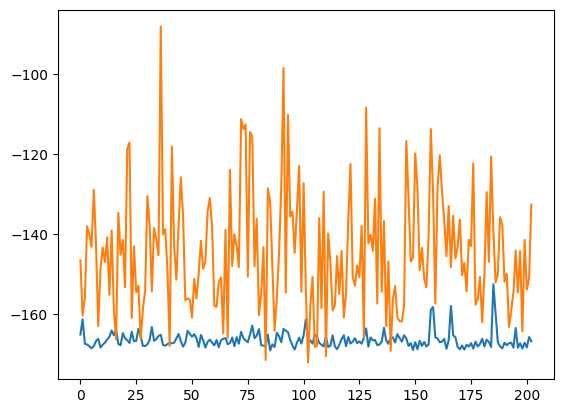

train_weighted_vae: dec
train: iter 0  trainloss -175.44071  validloss -153.07600±0.00000  bestvalidloss -153.07600  last_update 0
train: iter 1  trainloss -174.70734  validloss -173.91643±0.00000  bestvalidloss -173.91643  last_update 0
train: iter 2  trainloss -174.65913  validloss -155.96505±0.00000  bestvalidloss -173.91643  last_update 1
train: iter 3  trainloss -176.22433  validloss -159.08114±0.00000  bestvalidloss -173.91643  last_update 2
train: iter 4  trainloss -174.91569  validloss -163.76769±0.00000  bestvalidloss -173.91643  last_update 3
train: iter 5  trainloss -175.88227  validloss -162.41696±0.00000  bestvalidloss -173.91643  last_update 4
train: iter 6  trainloss -174.30772  validloss -143.27440±0.00000  bestvalidloss -173.91643  last_update 5
train: iter 7  trainloss -173.51526  validloss -158.58695±0.00000  bestvalidloss -173.91643  last_update 6
train: iter 8  trainloss -175.19150  validloss -172.24635±0.00000  bestvalidloss -173.91643  last_update 7
train: iter 9

train: iter 76  trainloss -177.07875  validloss -167.08517±0.00000  bestvalidloss -173.91643  last_update 75
train: iter 77  trainloss -176.22972  validloss -164.20960±0.00000  bestvalidloss -173.91643  last_update 76
train: iter 78  trainloss -176.31785  validloss -158.98943±0.00000  bestvalidloss -173.91643  last_update 77
train: iter 79  trainloss -174.42054  validloss -147.99509±0.00000  bestvalidloss -173.91643  last_update 78
train: iter 80  trainloss -178.53268  validloss -157.86218±0.00000  bestvalidloss -173.91643  last_update 79
train: iter 81  trainloss -174.64217  validloss -153.12141±0.00000  bestvalidloss -173.91643  last_update 80
train: iter 82  trainloss -174.96078  validloss -134.48597±0.00000  bestvalidloss -173.91643  last_update 81
train: iter 83  trainloss -171.02084  validloss -175.71606±0.00000  bestvalidloss -175.71606  last_update 0
train: iter 84  trainloss -177.46398  validloss -154.25770±0.00000  bestvalidloss -175.71606  last_update 1
train: iter 85  train

train: iter 151  trainloss -174.69097  validloss -146.56856±0.00000  bestvalidloss -175.71606  last_update 68
train: iter 152  trainloss -176.63929  validloss -152.58463±0.00000  bestvalidloss -175.71606  last_update 69
train: iter 153  trainloss -175.14626  validloss -155.23283±0.00000  bestvalidloss -175.71606  last_update 70
train: iter 154  trainloss -178.77152  validloss -179.62584±0.00000  bestvalidloss -179.62584  last_update 0
train: iter 155  trainloss -177.73345  validloss -148.40701±0.00000  bestvalidloss -179.62584  last_update 1
train: iter 156  trainloss -175.93723  validloss -149.21084±0.00000  bestvalidloss -179.62584  last_update 2
train: iter 157  trainloss -179.19926  validloss -151.97184±0.00000  bestvalidloss -179.62584  last_update 3
train: iter 158  trainloss -178.13480  validloss -160.94110±0.00000  bestvalidloss -179.62584  last_update 4
train: iter 159  trainloss -177.67470  validloss -164.16857±0.00000  bestvalidloss -179.62584  last_update 5
train: iter 160 

train: iter 226  trainloss -178.11640  validloss -149.80541±0.00000  bestvalidloss -179.62584  last_update 72
train: iter 227  trainloss -178.31377  validloss -159.55274±0.00000  bestvalidloss -179.62584  last_update 73
train: iter 228  trainloss -180.14316  validloss -158.98655±0.00000  bestvalidloss -179.62584  last_update 74
train: iter 229  trainloss -180.58209  validloss -148.66524±0.00000  bestvalidloss -179.62584  last_update 75
train: iter 230  trainloss -175.97857  validloss -160.98070±0.00000  bestvalidloss -179.62584  last_update 76
train: iter 231  trainloss -179.08002  validloss -151.96788±0.00000  bestvalidloss -179.62584  last_update 77
train: iter 232  trainloss -173.90830  validloss -133.61187±0.00000  bestvalidloss -179.62584  last_update 78
train: iter 233  trainloss -177.81790  validloss -125.10962±0.00000  bestvalidloss -179.62584  last_update 79
train: iter 234  trainloss -173.95302  validloss -153.20688±0.00000  bestvalidloss -179.62584  last_update 80
train: ite

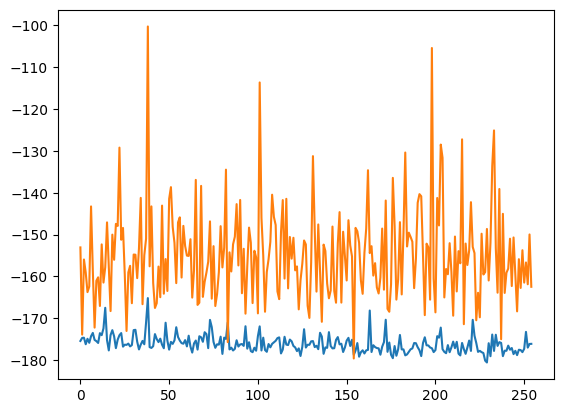

alpha 0.3 vae_lr 0.0005


In [27]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

0  c = 0.12963006163765808
1  c = 0.2565586857672717
2  c = 0.21129942588058706
3  c = 0.08663040148759928
4  c = 0.028356884145434146
5  c = 0.05807445474689273
6  c = 0.11025043537180891
7  c = 0.27551583760923004
8  c = 0.22680360827714094
9  c = 0.16275027715196158
10  c = 0.28383859403531697
11  c = 0.07029344009136586
12  c = 0.2779398360412865
13  c = 0.22876834920409764
14  c = 0.13807860181977055
15  c = 0.21604657992151063
16  c = 0.0711604441386705
17  c = 0.10532463879369379
18  c = 0.0016435317722175657
19  c = 0.22107316361652288
20  c = 0.0021274053508450017
21  c = 0.009313619407383344
22  c = 0.2164461168029911
23  c = 0.1010996628154094
24  c = 0.01406302063887984
25  c = 0.0018400784454395414
26  c = 0.11623035628649106
27  c = 0.09873067992433998
28  c = 0.2725855244354759
29  c = 0.0737810370403087
30  c = 0.14728437542547954
31  c = 0.188713418468948
32  c = 0.15062120791374403
33  c = 0.23837690802293415
34  c = 0.23182666688580017
35  c = 0.2435748512776646
36  

93  c = 0.15676747137139435
94  c = 0.12198798371219713
95  c = 0.03979962898093757
96  c = 0.17535542382549715
97  c = 0.05372135181422011
98  c = 0.1774298967289188
99  c = 0.09244278829943504
 
実環境方策rollout vs Sim環境方策rollout


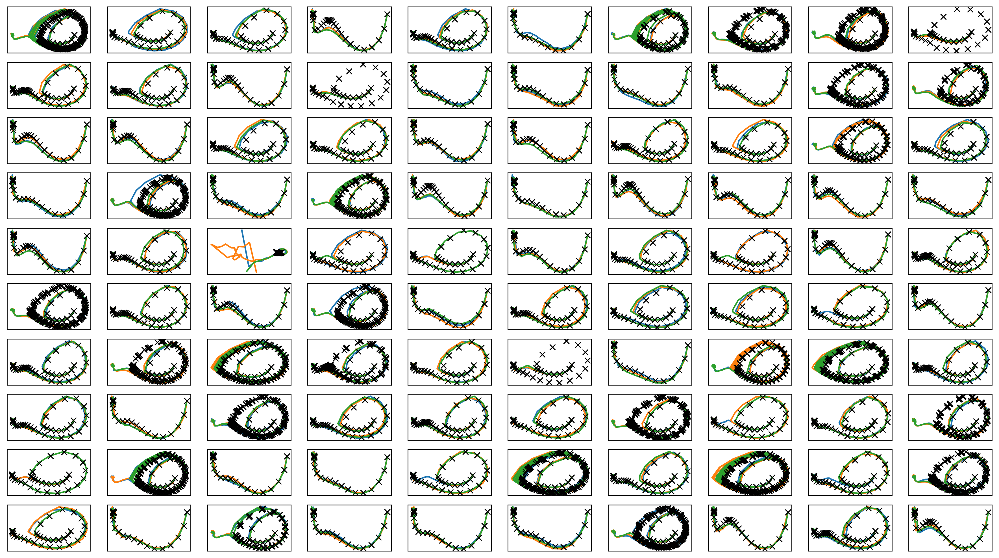

In [28]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

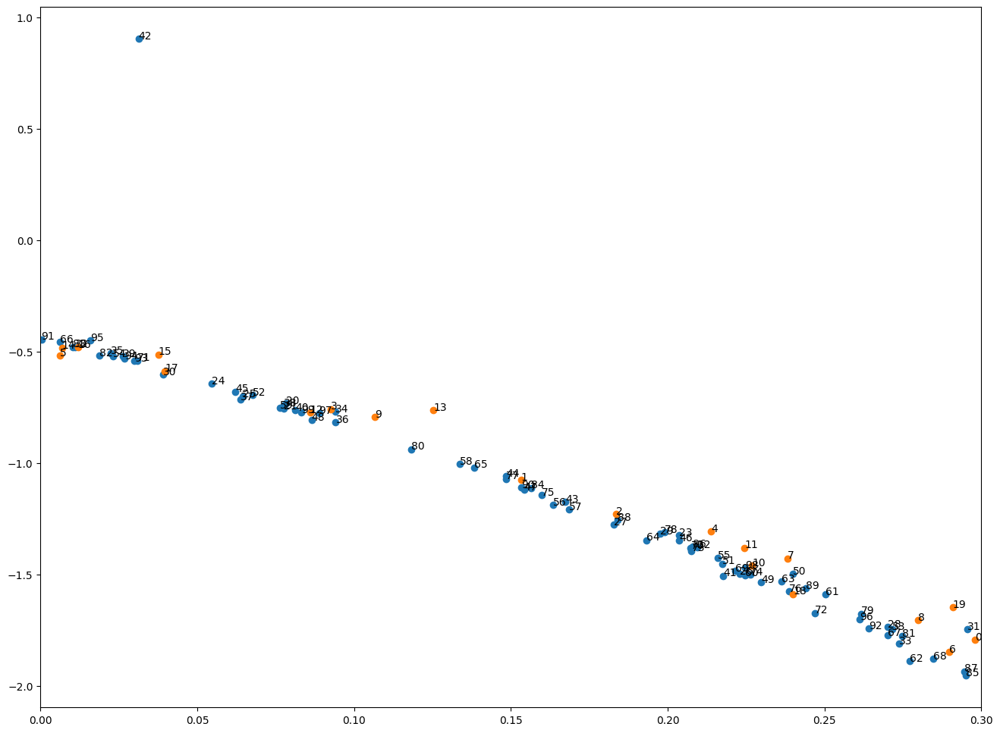

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [29]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [30]:
print(datetime.datetime.now())

2023-04-12 13:34:37.063825


# Iter 3

In [31]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  c = 0.20658392826918423
c = 0.2656539031867417
c = 0.07033541088885033
c = 0.167277038606891
c = 0.03843638073266876
c = 0.18781384986922792
c = 0.08938034117927285
c = 0.020879927136093622
c = 0.01164512560803399
1  c = 0.0011272362654512257
c = 0.27683905372013573
c = 0.2929042045405407
c = 0.018354941314563465
c = 0.23486187815581458
c = 0.1370593954342374
c = 0.27519893762492925
c = 0.27440185063809686
c = 0.02321336130119589
c = 0.02124279283785917
c = 0.24663490782727085
c = 0.0035345422851367657
2  c = 0.15241782863165823
c = 0.026382393829457784
c = 0.08564022264944944
c = 0.22483842647594376
c = 0.14477620463839433
3  c = 0.1668527959322015
c = 0.2971691293284473
c = 0.030007115863416232
c = 0.02383966701404473
c = 0.2866977630767624
c = 0.28122217377975867
c = 0.23240272337761933
c = 0.12188765106680158
c = 0.21122903761378584
c = 0.2260362906762949
c = 0.12248627165579253
c = 0.03986404881184726
4  c = 0.02676940509204755
c = 0.18458555660648426
c = 0.28735044687315076
c 

c = 0.2016870787926447
c = 0.014937155694523073
c = 0.22019192234812232
38  c = 0.20556761175772975
c = 0.06898819350824957
c = 0.07257534493955468
c = 0.11006583967869761
c = 0.07526123597369357
c = 0.1302157093388894
c = 0.22349030030405526
c = 0.26481606586876666
c = 0.27263598394041666
c = 0.27473315651641833
39  c = 0.10016155875791793
c = 0.24867660754648796
c = 0.16775267023023702
c = 0.1304841740359288
c = 0.16863887928768762
c = 0.06091094790298213
c = 0.12667425868838
c = 0.08650565521174036
c = 0.06537933173771378
40  c = 0.021026007182114392
c = 0.030508015987150826
c = 0.2538313962288225
c = 0.2570778663794059
c = 0.13392588363799857
c = 0.09077134539859859
c = 0.13641888944380182
41  c = 0.25676751228754613
c = 0.15349358638982435
c = 0.031810985938634025
c = 0.23287922381327314
c = 0.13222264963458413
c = 0.17366192188513063
c = 0.06367661225233025
c = 0.23350412723737965
c = 0.019489177978912586
c = 0.26363215769311443
c = 0.024496090408954996
42  c = 0.0187774337488626

/home/thishinuma/for_ieee_access/utils.py:10: RuntimeWarning: overflow encountered in cast
  return torch.from_numpy(x.astype(np.float32))


c = 0.25479024766817077
c = 0.2561302748661375
c = 0.18695874703211315
c = 0.15456338322796037
c = 0.24181950504545785
c = 0.11641060453621425
c = 0.1503800704862217
c = 0.22310447327828092
45  c = 0.1423259765114451
c = 0.2729417712005499
c = 0.24847937940174994
c = 0.10715387677736622
c = 0.2753115618734951
c = 0.26576374334783925
c = 0.2307490171578908
46  c = 0.06960855399530501
c = 0.12738970950416184
c = 0.019582666854146124
c = 0.039452023645100275
c = 0.2588380376937492
c = 0.18727491015273975
c = 0.17054947530587278
c = 0.12718464415223715
c = 0.28433869117863
c = 0.10376878561984636
c = 0.0816994525451112
47  c = 0.24475169877522873
c = 0.19186101960302412
c = 0.28023749348924526
c = 0.03762247638837738
c = 0.07896111750415644
c = 0.24362585910984694
c = 0.051968799734000315
c = 0.16987113693398093
c = 0.2737620837287466
c = 0.013217021392089256
c = 0.21327303332035238
c = 0.031941805173275536
c = 0.23443614199021845
c = 0.18888892852690709
c = 0.17773389120521083
48  c = 0.1

c = 0.0749252695148361
81  c = 0.015745344694441252
c = 0.19883530376042932
c = 0.04913431174883476
c = 0.13348969445462186
c = 0.22662406910550426
c = 0.06826357041911181
c = 0.17470040222583458
c = 0.24890693017138177
c = 0.21244960156629972
c = 0.19973606531878488
82  c = 0.22156743015250122
c = 0.02504404181291506
c = 0.08316352805151003
c = 0.21258917794703933
c = 0.08172529194968632
c = 0.08587680198396748
c = 0.21636849353344942
c = 0.17503479185816426
c = 0.02941209310523869
c = 0.1778580436070342
c = 0.14290106330646288
c = 0.1740211003969297
c = 0.0016682080496320916
c = 0.22681604220088972
c = 0.11442802145905297
83  c = 0.14249746726648269
c = 0.004536314945218778
c = 0.09655435527162154
c = 0.14367307317358957
c = 0.25646407837768503
c = 0.103835074207128
c = 0.17835071677551576
c = 0.24404812402166504
c = 0.24083100649143138
84  c = 0.1995339943539996
c = 0.028075600463525106
c = 0.1581029623960489
c = 0.2797421699417854
c = 0.24333698995997638
c = 0.11385054025383365
c =

In [32]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)



train: iter 0  trainloss 0.23750  validloss 0.15968±0.00000  bestvalidloss 0.15968  last_update 0
train: iter 1  trainloss 0.23139  validloss 0.16189±0.00000  bestvalidloss 0.15968  last_update 1
train: iter 2  trainloss 0.22509  validloss 0.16221±0.00000  bestvalidloss 0.15968  last_update 2
train: iter 3  trainloss 0.21542  validloss 0.16523±0.00000  bestvalidloss 0.15968  last_update 3
train: iter 4  trainloss 0.20614  validloss 0.17009±0.00000  bestvalidloss 0.15968  last_update 4
train: iter 5  trainloss 0.19828  validloss 0.16384±0.00000  bestvalidloss 0.15968  last_update 5
train: iter 6  trainloss 0.19513  validloss 0.16427±0.00000  bestvalidloss 0.15968  last_update 6
train: iter 7  trainloss 0.19258  validloss 0.16779±0.00000  bestvalidloss 0.15968  last_update 7
train: iter 8  trainloss 0.19224  validloss 0.16339±0.00000  bestvalidloss 0.15968  last_update 8
train: iter 9  trainloss 0.18962  validloss 0.16416±0.00000  bestvalidloss 0.15968  last_update 9
train: iter 10  trai

train: iter 84  trainloss 0.13915  validloss 0.16243±0.00000  bestvalidloss 0.15951  last_update 12
train: iter 85  trainloss 0.13796  validloss 0.16192±0.00000  bestvalidloss 0.15951  last_update 13
train: iter 86  trainloss 0.13804  validloss 0.16030±0.00000  bestvalidloss 0.15951  last_update 14
train: iter 87  trainloss 0.13802  validloss 0.16034±0.00000  bestvalidloss 0.15951  last_update 15
train: iter 88  trainloss 0.13833  validloss 0.15961±0.00000  bestvalidloss 0.15951  last_update 16
train: iter 89  trainloss 0.13843  validloss 0.16105±0.00000  bestvalidloss 0.15951  last_update 17
train: iter 90  trainloss 0.13896  validloss 0.15981±0.00000  bestvalidloss 0.15951  last_update 18
train: iter 91  trainloss 0.13993  validloss 0.16150±0.00000  bestvalidloss 0.15951  last_update 19
train: iter 92  trainloss 0.13796  validloss 0.16393±0.00000  bestvalidloss 0.15951  last_update 20
train: iter 93  trainloss 0.14034  validloss 0.16171±0.00000  bestvalidloss 0.15951  last_update 21


train: iter 168  trainloss 0.13433  validloss 0.16606±0.00000  bestvalidloss 0.15430  last_update 6
train: iter 169  trainloss 0.13437  validloss 0.15447±0.00000  bestvalidloss 0.15430  last_update 7
train: iter 170  trainloss 0.13352  validloss 0.15758±0.00000  bestvalidloss 0.15430  last_update 8
train: iter 171  trainloss 0.13381  validloss 0.15500±0.00000  bestvalidloss 0.15430  last_update 9
train: iter 172  trainloss 0.13471  validloss 0.15685±0.00000  bestvalidloss 0.15430  last_update 10
train: iter 173  trainloss 0.13684  validloss 0.15922±0.00000  bestvalidloss 0.15430  last_update 11
train: iter 174  trainloss 0.13273  validloss 0.15627±0.00000  bestvalidloss 0.15430  last_update 12
train: iter 175  trainloss 0.13312  validloss 0.15643±0.00000  bestvalidloss 0.15430  last_update 13
train: iter 176  trainloss 0.13427  validloss 0.15526±0.00000  bestvalidloss 0.15430  last_update 14
train: iter 177  trainloss 0.13349  validloss 0.15566±0.00000  bestvalidloss 0.15430  last_upda

train: iter 252  trainloss 0.13131  validloss 0.15753±0.00000  bestvalidloss 0.15340  last_update 5
train: iter 253  trainloss 0.13311  validloss 0.15395±0.00000  bestvalidloss 0.15340  last_update 6
train: iter 254  trainloss 0.13306  validloss 0.15646±0.00000  bestvalidloss 0.15340  last_update 7
train: iter 255  trainloss 0.13152  validloss 0.15698±0.00000  bestvalidloss 0.15340  last_update 8
train: iter 256  trainloss 0.13192  validloss 0.15400±0.00000  bestvalidloss 0.15340  last_update 9
train: iter 257  trainloss 0.13350  validloss 0.15708±0.00000  bestvalidloss 0.15340  last_update 10
train: iter 258  trainloss 0.13302  validloss 0.15748±0.00000  bestvalidloss 0.15340  last_update 11
train: iter 259  trainloss 0.13194  validloss 0.15661±0.00000  bestvalidloss 0.15340  last_update 12
train: iter 260  trainloss 0.13117  validloss 0.15404±0.00000  bestvalidloss 0.15340  last_update 13
train: iter 261  trainloss 0.13136  validloss 0.15957±0.00000  bestvalidloss 0.15340  last_updat

train: iter 336  trainloss 0.13324  validloss 0.15544±0.00000  bestvalidloss 0.15298  last_update 19
train: iter 337  trainloss 0.13060  validloss 0.15862±0.00000  bestvalidloss 0.15298  last_update 20
train: iter 338  trainloss 0.13128  validloss 0.15475±0.00000  bestvalidloss 0.15298  last_update 21
train: iter 339  trainloss 0.12982  validloss 0.15596±0.00000  bestvalidloss 0.15298  last_update 22
train: iter 340  trainloss 0.13023  validloss 0.15501±0.00000  bestvalidloss 0.15298  last_update 23
train: iter 341  trainloss 0.13082  validloss 0.15369±0.00000  bestvalidloss 0.15298  last_update 24
train: iter 342  trainloss 0.13100  validloss 0.15365±0.00000  bestvalidloss 0.15298  last_update 25
train: iter 343  trainloss 0.12945  validloss 0.15488±0.00000  bestvalidloss 0.15298  last_update 26
train: iter 344  trainloss 0.13185  validloss 0.15806±0.00000  bestvalidloss 0.15298  last_update 27
train: iter 345  trainloss 0.13086  validloss 0.15585±0.00000  bestvalidloss 0.15298  last_

train: iter 420  trainloss 0.12843  validloss 0.15604±0.00000  bestvalidloss 0.15267  last_update 40
train: iter 421  trainloss 0.12976  validloss 0.15701±0.00000  bestvalidloss 0.15267  last_update 41
train: iter 422  trainloss 0.13073  validloss 0.15570±0.00000  bestvalidloss 0.15267  last_update 42
train: iter 423  trainloss 0.12996  validloss 0.15430±0.00000  bestvalidloss 0.15267  last_update 43
train: iter 424  trainloss 0.13008  validloss 0.15728±0.00000  bestvalidloss 0.15267  last_update 44
train: iter 425  trainloss 0.12986  validloss 0.15560±0.00000  bestvalidloss 0.15267  last_update 45
train: iter 426  trainloss 0.12924  validloss 0.15527±0.00000  bestvalidloss 0.15267  last_update 46
train: iter 427  trainloss 0.12838  validloss 0.15806±0.00000  bestvalidloss 0.15267  last_update 47
train: iter 428  trainloss 0.12760  validloss 0.15849±0.00000  bestvalidloss 0.15267  last_update 48
train: iter 429  trainloss 0.12800  validloss 0.15332±0.00000  bestvalidloss 0.15267  last_

train: iter 504  trainloss 0.12869  validloss 0.15369±0.00000  bestvalidloss 0.15208  last_update 23
train: iter 505  trainloss 0.12859  validloss 0.15864±0.00000  bestvalidloss 0.15208  last_update 24
train: iter 506  trainloss 0.12966  validloss 0.15198±0.00000  bestvalidloss 0.15198  last_update 0
train: iter 507  trainloss 0.12929  validloss 0.15421±0.00000  bestvalidloss 0.15198  last_update 1
train: iter 508  trainloss 0.12827  validloss 0.15370±0.00000  bestvalidloss 0.15198  last_update 2
train: iter 509  trainloss 0.12826  validloss 0.15551±0.00000  bestvalidloss 0.15198  last_update 3
train: iter 510  trainloss 0.12966  validloss 0.15704±0.00000  bestvalidloss 0.15198  last_update 4
train: iter 511  trainloss 0.12876  validloss 0.16082±0.00000  bestvalidloss 0.15198  last_update 5
train: iter 512  trainloss 0.12772  validloss 0.15480±0.00000  bestvalidloss 0.15198  last_update 6
train: iter 513  trainloss 0.12809  validloss 0.15496±0.00000  bestvalidloss 0.15198  last_update 

train: iter 588  trainloss 0.12678  validloss 0.15368±0.00000  bestvalidloss 0.15181  last_update 10
train: iter 589  trainloss 0.12729  validloss 0.15708±0.00000  bestvalidloss 0.15181  last_update 11
train: iter 590  trainloss 0.12631  validloss 0.16030±0.00000  bestvalidloss 0.15181  last_update 12
train: iter 591  trainloss 0.12722  validloss 0.16079±0.00000  bestvalidloss 0.15181  last_update 13
train: iter 592  trainloss 0.12621  validloss 0.15309±0.00000  bestvalidloss 0.15181  last_update 14
train: iter 593  trainloss 0.12531  validloss 0.15184±0.00000  bestvalidloss 0.15181  last_update 15
train: iter 594  trainloss 0.12778  validloss 0.15529±0.00000  bestvalidloss 0.15181  last_update 16
train: iter 595  trainloss 0.12629  validloss 0.15345±0.00000  bestvalidloss 0.15181  last_update 17
train: iter 596  trainloss 0.12899  validloss 0.15650±0.00000  bestvalidloss 0.15181  last_update 18
train: iter 597  trainloss 0.12726  validloss 0.15825±0.00000  bestvalidloss 0.15181  last_

train: iter 672  trainloss 0.12636  validloss 0.15874±0.00000  bestvalidloss 0.15149  last_update 64
train: iter 673  trainloss 0.12856  validloss 0.15363±0.00000  bestvalidloss 0.15149  last_update 65
train: iter 674  trainloss 0.12618  validloss 0.15275±0.00000  bestvalidloss 0.15149  last_update 66
train: iter 675  trainloss 0.12646  validloss 0.15670±0.00000  bestvalidloss 0.15149  last_update 67
train: iter 676  trainloss 0.12630  validloss 0.15491±0.00000  bestvalidloss 0.15149  last_update 68
train: iter 677  trainloss 0.12576  validloss 0.15356±0.00000  bestvalidloss 0.15149  last_update 69
train: iter 678  trainloss 0.12596  validloss 0.15129±0.00000  bestvalidloss 0.15129  last_update 0
train: iter 679  trainloss 0.12568  validloss 0.15407±0.00000  bestvalidloss 0.15129  last_update 1
train: iter 680  trainloss 0.12551  validloss 0.15141±0.00000  bestvalidloss 0.15129  last_update 2
train: iter 681  trainloss 0.12544  validloss 0.15362±0.00000  bestvalidloss 0.15129  last_upd

train: iter 756  trainloss 0.12473  validloss 0.15728±0.00000  bestvalidloss 0.15129  last_update 78
train: iter 757  trainloss 0.12618  validloss 0.15136±0.00000  bestvalidloss 0.15129  last_update 79
train: iter 758  trainloss 0.12437  validloss 0.15296±0.00000  bestvalidloss 0.15129  last_update 80
train: iter 759  trainloss 0.12424  validloss 0.15720±0.00000  bestvalidloss 0.15129  last_update 81
train: iter 760  trainloss 0.12571  validloss 0.15785±0.00000  bestvalidloss 0.15129  last_update 82
train: iter 761  trainloss 0.12520  validloss 0.15491±0.00000  bestvalidloss 0.15129  last_update 83
train: iter 762  trainloss 0.12391  validloss 0.15329±0.00000  bestvalidloss 0.15129  last_update 84
train: iter 763  trainloss 0.12623  validloss 0.15463±0.00000  bestvalidloss 0.15129  last_update 85
train: iter 764  trainloss 0.12601  validloss 0.15444±0.00000  bestvalidloss 0.15129  last_update 86
train: iter 765  trainloss 0.12387  validloss 0.15630±0.00000  bestvalidloss 0.15129  last_

In [33]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -170.45113227680326
valid_loss:  -164.88506861925126
train_loss:  -154.4902566075325
valid_loss:  -102.40709621191024


1e-08 1000.0


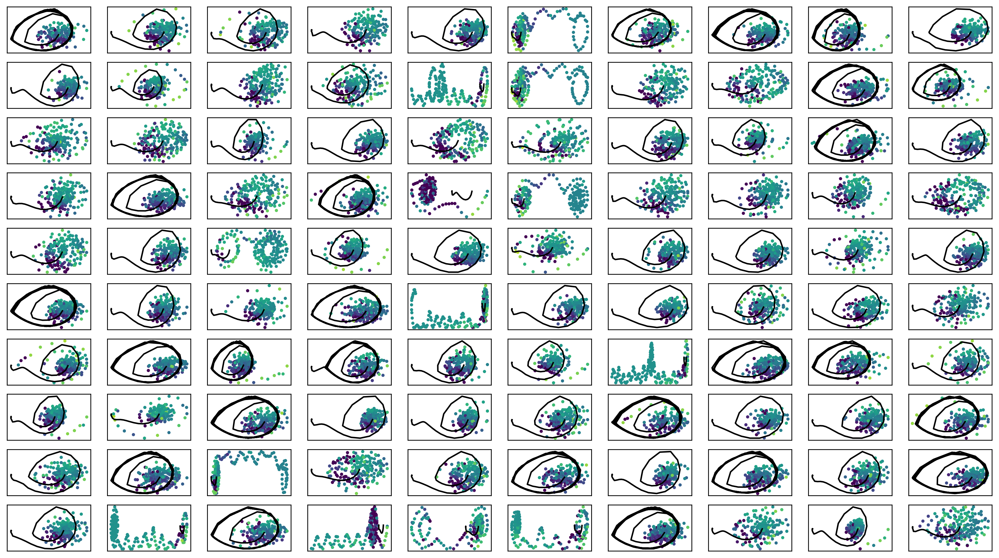

In [34]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [35]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [36]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [37]:
# i = 49
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

train_weighted_vae: enc_dec
train: iter 0  trainloss -157.77870  validloss -101.21095±0.00000  bestvalidloss -101.21095  last_update 0
train: iter 1  trainloss -165.11599  validloss -155.67508±0.00000  bestvalidloss -155.67508  last_update 0
train: iter 2  trainloss -163.09094  validloss -154.65251±0.00000  bestvalidloss -155.67508  last_update 1
train: iter 3  trainloss -157.35886  validloss -119.56084±0.00000  bestvalidloss -155.67508  last_update 2
train: iter 4  trainloss -162.71385  validloss -155.91442±0.00000  bestvalidloss -155.91442  last_update 0
train: iter 5  trainloss -155.79372  validloss -152.61202±0.00000  bestvalidloss -155.91442  last_update 1
train: iter 6  trainloss -156.28474  validloss -151.62028±0.00000  bestvalidloss -155.91442  last_update 2
train: iter 7  trainloss -160.83209  validloss -156.46010±0.00000  bestvalidloss -156.46010  last_update 0
train: iter 8  trainloss -159.49235  validloss -106.44473±0.00000  bestvalidloss -156.46010  last_update 1
train: it

train: iter 76  trainloss -164.25563  validloss -149.08069±0.00000  bestvalidloss -170.72623  last_update 11
train: iter 77  trainloss -134.38745  validloss -97.30950±0.00000  bestvalidloss -170.72623  last_update 12
train: iter 78  trainloss -159.45622  validloss -143.59473±0.00000  bestvalidloss -170.72623  last_update 13
train: iter 79  trainloss -161.26045  validloss -134.57039±0.00000  bestvalidloss -170.72623  last_update 14
train: iter 80  trainloss -162.47514  validloss -157.89239±0.00000  bestvalidloss -170.72623  last_update 15
train: iter 81  trainloss -159.18080  validloss -152.99088±0.00000  bestvalidloss -170.72623  last_update 16
train: iter 82  trainloss -158.05332  validloss -159.83068±0.00000  bestvalidloss -170.72623  last_update 17
train: iter 83  trainloss -158.79164  validloss -148.32157±0.00000  bestvalidloss -170.72623  last_update 18
train: iter 84  trainloss -160.49675  validloss -146.39378±0.00000  bestvalidloss -170.72623  last_update 19
train: iter 85  trai

train: iter 151  trainloss -152.02483  validloss -155.31378±0.00000  bestvalidloss -170.72623  last_update 86
train: iter 152  trainloss -164.34012  validloss -153.81468±0.00000  bestvalidloss -170.72623  last_update 87
train: iter 153  trainloss -167.14107  validloss -139.28028±0.00000  bestvalidloss -170.72623  last_update 88
train: iter 154  trainloss -157.51283  validloss -122.32718±0.00000  bestvalidloss -170.72623  last_update 89
train: iter 155  trainloss -164.03757  validloss -119.55888±0.00000  bestvalidloss -170.72623  last_update 90
train: iter 156  trainloss -167.29704  validloss -160.42588±0.00000  bestvalidloss -170.72623  last_update 91
train: iter 157  trainloss -163.74178  validloss -161.75054±0.00000  bestvalidloss -170.72623  last_update 92
train: iter 158  trainloss -165.94971  validloss -144.42292±0.00000  bestvalidloss -170.72623  last_update 93
train: iter 159  trainloss -157.85689  validloss -159.44465±0.00000  bestvalidloss -170.72623  last_update 94
train: ite

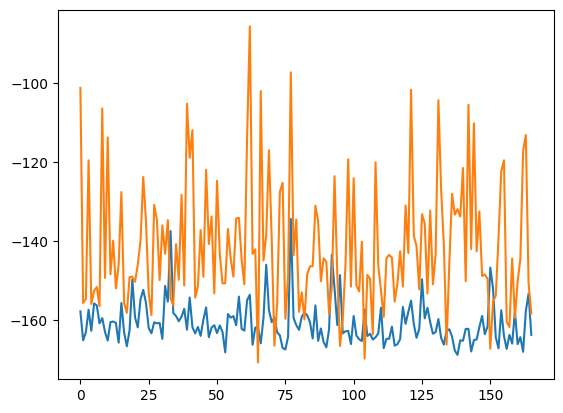

train_weighted_vae: enc
train: iter 0  trainloss -163.67817  validloss -165.35967±0.00000  bestvalidloss -165.35967  last_update 0
train: iter 1  trainloss -165.15456  validloss -144.24573±0.00000  bestvalidloss -165.35967  last_update 1
train: iter 2  trainloss -161.93578  validloss -129.70714±0.00000  bestvalidloss -165.35967  last_update 2
train: iter 3  trainloss -165.91513  validloss -151.49681±0.00000  bestvalidloss -165.35967  last_update 3
train: iter 4  trainloss -164.24260  validloss -145.80295±0.00000  bestvalidloss -165.35967  last_update 4
train: iter 5  trainloss -165.09057  validloss -154.86302±0.00000  bestvalidloss -165.35967  last_update 5
train: iter 6  trainloss -165.15805  validloss -156.30657±0.00000  bestvalidloss -165.35967  last_update 6
train: iter 7  trainloss -163.39913  validloss -150.32548±0.00000  bestvalidloss -165.35967  last_update 7
train: iter 8  trainloss -163.93099  validloss -155.58460±0.00000  bestvalidloss -165.35967  last_update 8
train: iter 9

train: iter 76  trainloss -165.08395  validloss -147.22682±0.00000  bestvalidloss -166.69422  last_update 26
train: iter 77  trainloss -164.50877  validloss -140.95813±0.00000  bestvalidloss -166.69422  last_update 27
train: iter 78  trainloss -165.25990  validloss -160.09425±0.00000  bestvalidloss -166.69422  last_update 28
train: iter 79  trainloss -161.62271  validloss -151.73570±0.00000  bestvalidloss -166.69422  last_update 29
train: iter 80  trainloss -163.85236  validloss -142.32492±0.00000  bestvalidloss -166.69422  last_update 30
train: iter 81  trainloss -164.81271  validloss -135.17250±0.00000  bestvalidloss -166.69422  last_update 31
train: iter 82  trainloss -164.60498  validloss -149.38097±0.00000  bestvalidloss -166.69422  last_update 32
train: iter 83  trainloss -164.75953  validloss -155.37310±0.00000  bestvalidloss -166.69422  last_update 33
train: iter 84  trainloss -165.11179  validloss -152.99431±0.00000  bestvalidloss -166.69422  last_update 34
train: iter 85  tra

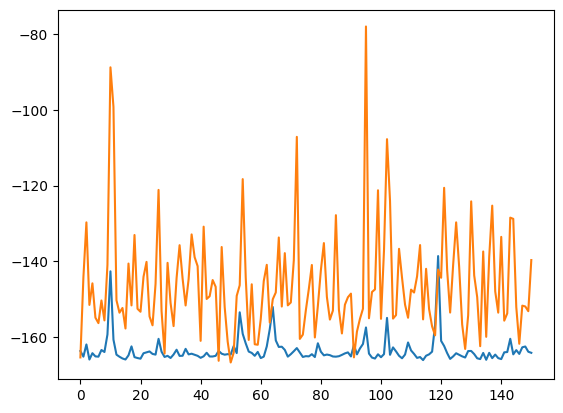

train_weighted_vae: dec
train: iter 0  trainloss -161.72728  validloss -149.42552±0.00000  bestvalidloss -149.42552  last_update 0
train: iter 1  trainloss -167.18444  validloss -139.09084±0.00000  bestvalidloss -149.42552  last_update 1
train: iter 2  trainloss -167.40744  validloss -149.82697±0.00000  bestvalidloss -149.82697  last_update 0
train: iter 3  trainloss -161.51129  validloss -116.56002±0.00000  bestvalidloss -149.82697  last_update 1
train: iter 4  trainloss -166.46584  validloss -139.20351±0.00000  bestvalidloss -149.82697  last_update 2
train: iter 5  trainloss -168.06697  validloss -147.77175±0.00000  bestvalidloss -149.82697  last_update 3
train: iter 6  trainloss -166.02295  validloss -144.66041±0.00000  bestvalidloss -149.82697  last_update 4
train: iter 7  trainloss -158.28038  validloss -112.10645±0.00000  bestvalidloss -149.82697  last_update 5
train: iter 8  trainloss -165.18246  validloss -145.98043±0.00000  bestvalidloss -149.82697  last_update 6
train: iter 9

train: iter 76  trainloss -163.15835  validloss -144.20316±0.00000  bestvalidloss -157.80727  last_update 60
train: iter 77  trainloss -165.03375  validloss -127.74731±0.00000  bestvalidloss -157.80727  last_update 61
train: iter 78  trainloss -161.26361  validloss -136.55298±0.00000  bestvalidloss -157.80727  last_update 62
train: iter 79  trainloss -167.85269  validloss -128.22310±0.00000  bestvalidloss -157.80727  last_update 63
train: iter 80  trainloss -167.67267  validloss -149.65639±0.00000  bestvalidloss -157.80727  last_update 64
train: iter 81  trainloss -167.96059  validloss -146.59485±0.00000  bestvalidloss -157.80727  last_update 65
train: iter 82  trainloss -166.87372  validloss -132.81307±0.00000  bestvalidloss -157.80727  last_update 66
train: iter 83  trainloss -163.94101  validloss -143.78099±0.00000  bestvalidloss -157.80727  last_update 67
train: iter 84  trainloss -167.65931  validloss -137.28222±0.00000  bestvalidloss -157.80727  last_update 68
train: iter 85  tra

train: iter 151  trainloss -165.01235  validloss -109.09205±0.00000  bestvalidloss -158.35067  last_update 51
train: iter 152  trainloss -168.36608  validloss -138.35307±0.00000  bestvalidloss -158.35067  last_update 52
train: iter 153  trainloss -168.81479  validloss -142.18649±0.00000  bestvalidloss -158.35067  last_update 53
train: iter 154  trainloss -169.89556  validloss -134.30552±0.00000  bestvalidloss -158.35067  last_update 54
train: iter 155  trainloss -166.71284  validloss -142.44832±0.00000  bestvalidloss -158.35067  last_update 55
train: iter 156  trainloss -166.65964  validloss -136.85708±0.00000  bestvalidloss -158.35067  last_update 56
train: iter 157  trainloss -167.45027  validloss -147.03163±0.00000  bestvalidloss -158.35067  last_update 57
train: iter 158  trainloss -168.65964  validloss -129.99626±0.00000  bestvalidloss -158.35067  last_update 58
train: iter 159  trainloss -160.98085  validloss -146.51473±0.00000  bestvalidloss -158.35067  last_update 59
train: ite

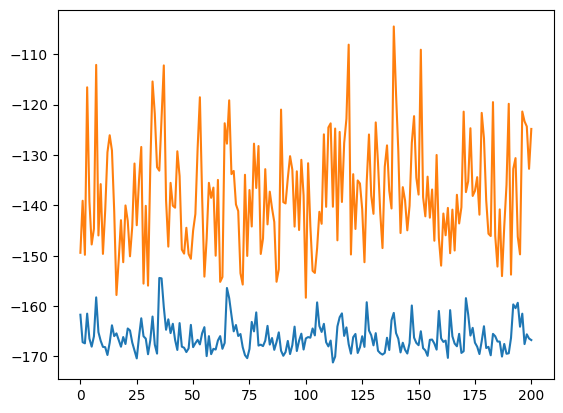

alpha 0.3 vae_lr 0.0005


In [38]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

0  c = 0.12241831872072634
1  c = 0.054758146180341215
2  c = 0.06845612482191753
3  c = 0.1703669460577957
4  c = 0.23800258316803935
5  c = 0.21102438655112957
6  c = 0.13106104074530195
7  c = 0.2752642119025177
8  c = 0.12234800756425851
9  c = 0.06682577179427472
10  c = 0.009257458598608914
11  c = 0.10594380006662389
12  c = 0.20888512729488343
13  c = 0.275833065589951
14  c = 0.027652816480826747
15  c = 0.0342042143547184
16  c = 0.21610927434661842
17  c = 0.04438184821827533
18  c = 0.06055946487685776
19  c = 0.14150058872075535
20  c = 0.2192042718807898
21  c = 0.20124257473397086
22  c = 0.2215190835362547
23  c = 0.02140096899057845
24  c = 0.28784666791807423
25  c = 0.10638846676987168
26  c = 0.28529484943964545
27  c = 0.06763099017922836
28  c = 0.026307560335386303
29  c = 0.1322395073931146
30  c = 0.13996564660973893
31  c = 0.19095803467375574
32  c = 0.1030880891675471
33  c = 0.13392282881557707
34  c = 0.13575610690238055
35  c = 0.1212557151018775
36  c = 

96  c = 0.29251703383444316
97  c = 0.23167942029382496
98  c = 0.23021326264259964
99  c = 0.013671663501238983
 
実環境方策rollout vs Sim環境方策rollout


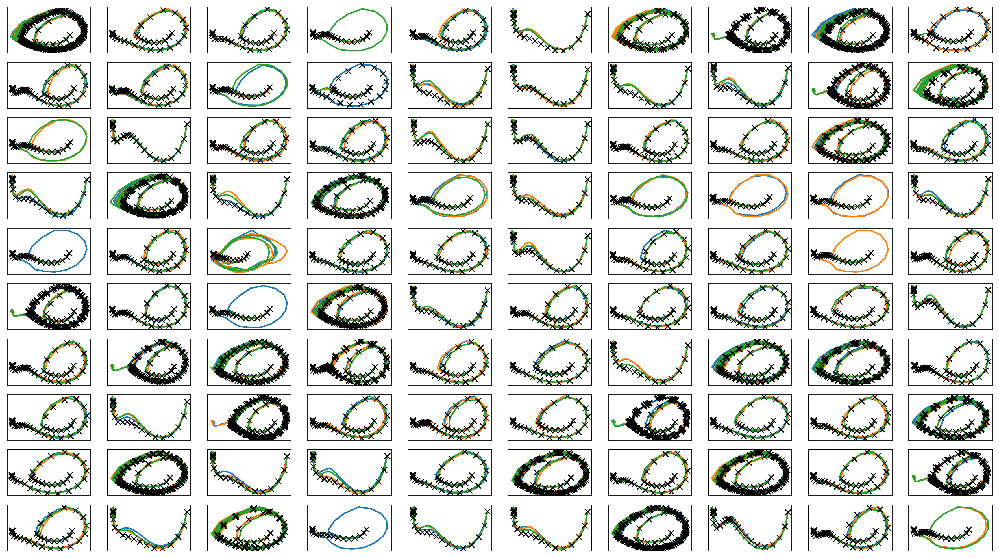

In [39]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

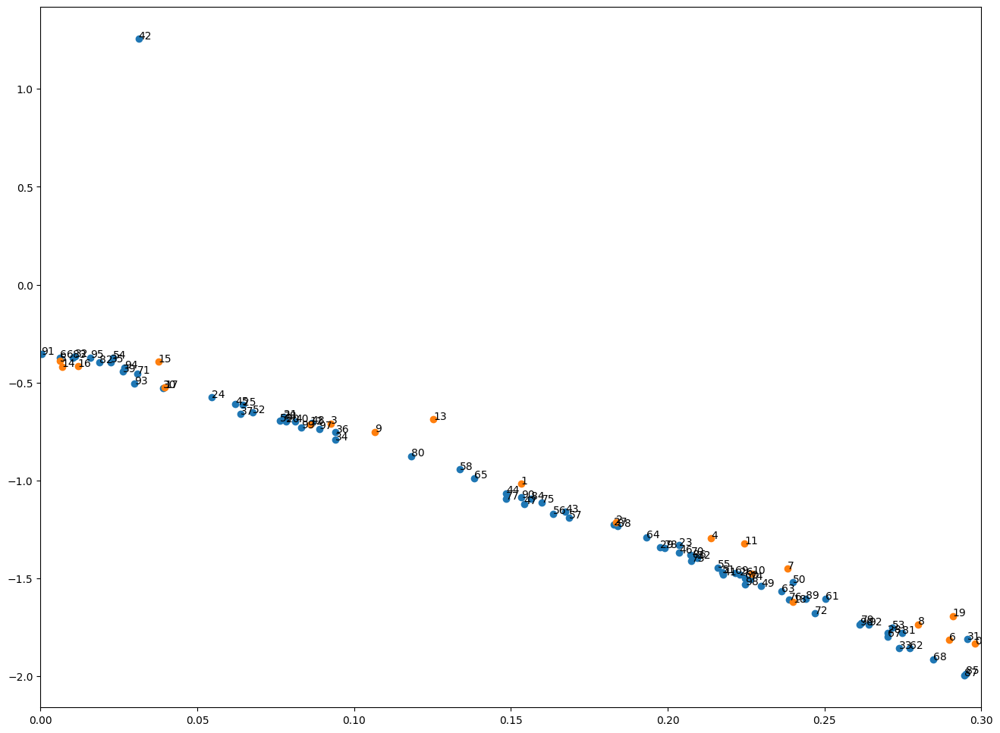

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [40]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [41]:
print(datetime.datetime.now())

2023-04-12 14:00:38.541985


# Iter 4

In [42]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  c = 0.16747821104928814
c = 0.17900302857242284
c = 0.23974624401661987
c = 0.1630173841757522
c = 0.06447531415786245
c = 0.19545156792201787
c = 0.2791320717440839
c = 0.08559621842583462
c = 0.22667289663190232
c = 0.25407604470312245
1  c = 0.01454361567585195
c = 0.26170772211176835
c = 0.2709752241904054
c = 0.04082999811353871
c = 0.10485382596289561
c = 0.24277286638411005
c = 0.23390988265757606
c = 0.03791677817306231
c = 0.17480577179497403
c = 0.2610548169126173
c = 0.016685875208123535
2  c = 0.0883860030145163
c = 0.11085515394879306
c = 0.1705790591175286
c = 0.27340072917331026
c = 0.29968832776140125
c = 0.2512836843584621
3  c = 0.09881595607604045
c = 0.20524916433544207
c = 0.23729145215276107
c = 0.09940745521940153
c = 0.05845854197816249
c = 0.18413733634588628
c = 0.0904511302933518
c = 0.2559090398583431
c = 0.16978880161603233
c = 0.09779380304140564
4  c = 0.26088845446078984
c = 0.2857573517176267
c = 0.07977406883841787
c = 0.08880200600821561
c = 0.0170

c = 0.0747410525395072
36  c = 0.03982608459933299
c = 0.2754942396910435
c = 0.19542432974473403
c = 0.1525121607683708
c = 0.1508023756740068
c = 0.001066179099139841
c = 0.21172272022099234
37  c = 0.1939547116737133
c = 0.211044350028902
c = 0.05094401816172543
c = 0.030442474355693114
c = 0.16878244679569904
c = 0.18396426817076242
c = 0.06283336843175953
c = 0.15698364978733217
c = 0.26833200457066475
c = 0.1789586352072164
c = 0.018639526806702333
c = 0.16748652908720477
c = 0.057564925425216705
c = 0.19063831395663497
c = 0.250983661590116
38  c = 0.05339204151791144
c = 0.12150705564738072
c = 0.25840082339546033
c = 0.22877884309539606
c = 0.025595563260796515
c = 0.29914268553254225
39  c = 0.15096029568742314
c = 0.28268754023907156
c = 0.039958764422120915
c = 0.004757557112478006
c = 0.05231533879955717
c = 0.2646314414140453
c = 0.2191277988927236
40  c = 0.05264991371438168
c = 0.17942692708258792
c = 0.27082192327828075
c = 0.15935718007188165
c = 0.1798914566182179
c 

c = 0.1783194826266449
c = 0.04166227995327948
c = 0.06125234314940305
c = 0.2160958702524881
c = 0.060404338434346345
77  c = 0.28485869272148595
c = 0.19814159732737768
c = 0.11835575986169282
c = 0.2554213178454191
c = 0.18580259164029808
c = 0.1996634557100391
c = 0.2852305532851172
c = 0.07899928442219838
c = 0.13276044286715008
c = 0.03702735521816904
78  c = 0.2593323222159236
c = 0.28784114909062714
c = 0.27083544612114485
c = 0.021551801411887183
c = 0.25755530178639063
c = 0.049584015567754144
c = 0.05961360975000993
c = 0.004413370592018806
c = 0.22260457830804847
c = 0.21241897431166162
79  c = 0.012724063268569208
c = 0.15433342309009507
c = 0.22846136907952752
c = 0.09216358181194302
c = 0.19608010761327438
c = 0.18822038028969096
c = 0.2567373162468605
80  c = 0.21946246487445947
c = 0.2232857329494569
c = 0.2476686717660744
c = 0.2568522056659882
c = 0.22311697110571216
c = 0.2936607591937887
c = 0.1690751223581259
c = 0.14679871720618445
c = 0.18590867496795738
c = 0.2

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss 0.13805  validloss 0.16532±0.00000  bestvalidloss 0.16532  last_update 0
train: iter 1  trainloss 0.13611  validloss 0.16299±0.00000  bestvalidloss 0.16299  last_update 0
train: iter 2  trainloss 0.13360  validloss 0.15948±0.00000  bestvalidloss 0.15948  last_update 0
train: iter 3  trainloss 0.13302  validloss 0.16422±0.00000  bestvalidloss 0.15948  last_update 1
train: iter 4  trainloss 0.13270  validloss 0.15907±0.00000  bestvalidloss 0.15907  last_update 0
train: iter 5  trainloss 0.13276  validloss 0.15866±0.00000  bestvalidloss 0.15866  last_update 0
train: iter 6  trainloss 0.13154  validloss 0.15803±0.00000  bestvalidloss 0.15803  last_update 0
train: iter 7  trainloss 0.13630  validloss 0.15952±0.00000  bestvalidloss 0.15803  last_update 1
train: iter 8  trainloss 0.13250  validloss 0.15849±0.00000  bestvalidloss 0.15803  last_update 2
train: iter 9  trainloss 0.13209  validloss 0.15944±0.00000  bestvalidloss 0.15803  last_update 3
train: iter 10  trai

In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter4.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# i = 35
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter4.png")
plt.savefig(figfilenamehead+"joint_iter4.eps")
plt.savefig(figfilenamehead+"joint_iter4.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter4.png")
plt.savefig(figfilenamehead+"damping_latent_iter4.eps")
plt.savefig(figfilenamehead+"damping_latent_iter4.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])

# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter5

In [ ]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter5.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter5.png")
plt.savefig(figfilenamehead+"joint_iter5.eps")
plt.savefig(figfilenamehead+"joint_iter5.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter5.png")
plt.savefig(figfilenamehead+"damping_latent_iter5.eps")
plt.savefig(figfilenamehead+"damping_latent_iter5.pdf")

plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# 評価関数計算

In [ ]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=100)


In [ ]:
print(iwvi.initial_belief)


In [ ]:
train_curve, valid_curve = iwvi.train_penalty(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100)

In [ ]:
plt.plot(train_curve)
plt.plot(valid_curve)

In [ ]:
iwvi.save()

In [ ]:
loss_array = np.array(loss_list)

In [ ]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.png")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.eps")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

In [ ]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve_normalized_"+env_str+".png")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve_normalized_"+env_str+".eps")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve_normalized_"+env_str+".pdf")